# Reciprocal RM for OBC data redatuming with sparse receiver geometries

In [1]:
# env: UD_RM
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt

from scipy.sparse import vstack
from scipy.sparse.linalg import lsqr
from scipy.signal import convolve, filtfilt

from pylops.utils                      import dottest
from pylops.utils.wavelets             import *
from pylops.utils.seismicevents        import *
from pylops.utils.tapers               import *
from pylops.basicoperators             import *
from pylops.signalprocessing           import *
from pylops.waveeqprocessing.mdd       import *
from pylops.waveeqprocessing.marchenko import directwave
from pylops.optimization.leastsquares  import *
from pylops.optimization.sparsity      import *

from pylops.waveeqprocessing.kirchhoff import Kirchhoff

## Parameters

In [13]:
# Ray-Marchenko preparation
vsx, vsz = 2200, 1076 # virtual source
troff = 0.05          # direct arrival time shift receiver side 0.05
tsoff = 0.05          # direct arrival time shift source side 0.05
nsmooth = 10          # time window smoothing 10
n_iter = 10           # iterations
nfmax = 800           # max frequency

## Inputs

In [3]:
inputfile = '/home/wangn0e/2022-2023/first_research/dataset/overthrust_RM15_pzsum.npz' 
inputdata = np.load(inputfile)
inputdata.files

['Pd', 'Puw', 'r', 's', 'rho', 'vel', 't', 'x', 'z', 'wav']

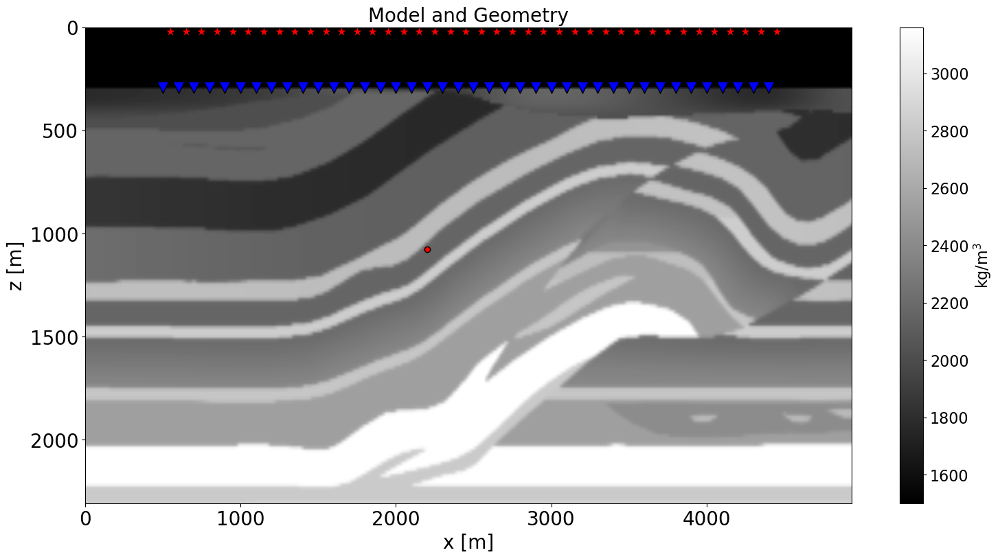

In [8]:
# Receivers
r = inputdata['r']
nr = r.shape[1]
dr = r[0,1]-r[0,0]

# Sources
s = inputdata['s']
ns = s.shape[1]
ds = s[0,1]-s[0,0]

# models
rho = inputdata['rho']
vel = inputdata['vel']

# Time axis
t = inputdata['t']
ot, dt, nt = t[0], t[1]-t[0], len(t)

# Axes
x, z = inputdata['x'], inputdata['z']
dx, dz = x[1] - x[0], z[1] - z[0]

# Wavelet
wav = inputdata['wav']
wav = wav / np.max(np.abs(np.fft.fft(wav))*dt) 
wav_c = np.argmax(wav)

# Virtual source
vs=(vsx, vsz) 

plt.figure(figsize=(18,9))
h=plt.imshow(vel, cmap='gray', extent = (x[0], x[-1], z[-1], z[0]))
plt.scatter(s[0, 5::10], s[1, 5::10], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(r[0, ::10],  r[1, ::10], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(vs[0], vs[1], c='r', edgecolors='k')
plt.axis('tight')
plt.xlabel('x [m]',fontsize=20),plt.ylabel('z [m]',fontsize=20),plt.title('Model and Geometry',fontsize=20)
plt.xticks(fontsize=20),plt.yticks(fontsize=20)
plt.colorbar(h,label="kg/m$^3$")
plt.xlim(x[0], x[-1]);

In [9]:
# velocity data
Pd  = inputdata['Pd'].transpose(1, 0, 2)        # organized as  (s, r, t)->(r, s, t)
Pu  = inputdata['Puw'].transpose(1, 0, 2)       # organized as  (s, r, t)->(r, s, t)

In [10]:
ntaper = 11        # source/receiver taper lenght

# tapering
taper = taper3d(nt, [nr, ns], [ntaper, ntaper], tapertype='hanning') # cosine/hanning
Pd = Pd*taper
Pu = Pu*taper

In [11]:
# Convolve data with wavelet 
convolvedata = False        # Apply convolution to data
if convolvedata:
    Pu = dt * np.apply_along_axis(convolve, -1, Pu, wav, mode='full')
    Pu = Pu[..., wav_c:][..., :nt]
    Pd = dt * np.apply_along_axis(convolve, -1, Pd, wav, mode='full')
    Pd = Pd[..., wav_c:][..., :nt] 

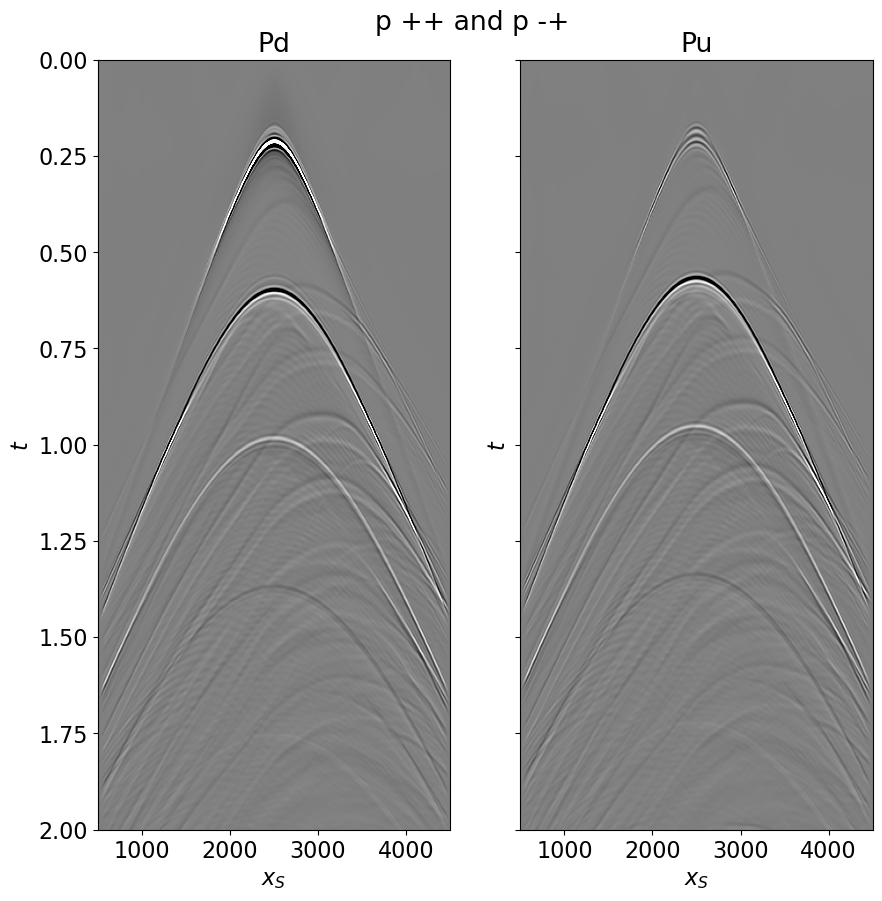

In [12]:
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(10, 10))
fig.suptitle('p ++ and p -+', y=0.93)
axs[0].imshow(Pd[nr//2].T, cmap='gray', vmin=-0.1*np.abs(Pd+Pu).max(), 
              vmax=0.1*np.abs(Pd+Pu).max(), extent=(s[0,0], s[0,-1], t[-1], t[0]))
axs[0].set_title('Pd'), axs[0].set_xlabel(r'$x_S$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(Pu[nr//2].T, cmap='gray', vmin=-0.1*np.abs(Pd+Pu).max(), 
              vmax=0.1*np.abs(Pd+Pu).max(), extent=(s[0,0], s[0,-1], t[-1], t[0]))
axs[1].set_title('Pu'), axs[1].set_xlabel(r'$x_S$'), axs[1].set_ylabel(r'$t$')
axs[1].axis('tight')
axs[1].set_ylim(2,0);

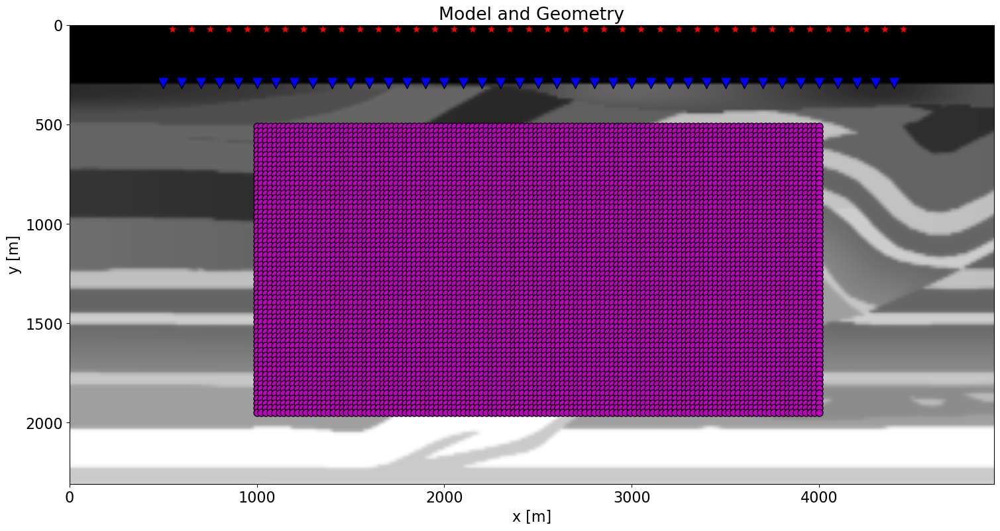

In [14]:
# Imaging domain
nvsx, nvsz = 126, 61
dvsx, dvsz = 24, 24
vsx = np.arange(nvsx)*dvsx + 1000
vsz = np.arange(nvsz)*dvsz + 510
VSX, VSZ = np.meshgrid(vsx, vsz, indexing='ij')

plt.figure(figsize=(18,9))
plt.imshow(vel, cmap='gray', extent = (x[0], x[-1], z[-1], z[0]))
plt.scatter(s[0, 5::10], s[1, 5::10], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(r[0, ::10],  r[1, ::10], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(VSX.ravel(), VSZ.ravel(), marker='.', s=250, c='m', edgecolors='k')
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]'),plt.title('Model and Geometry')
plt.xlim(x[0], x[-1]);

In [ ]:
# # if needed, interpolate velocity model

# # Create interpolation function
# interp_func = interp2d(np.arange(vel.shape[1]),
#                        np.arange(vel.shape[0]),
#                        vel,
#                        kind='linear')

# # Interpolate to the new dimensions
# vel_shape1 = 2401
# vel_shape0 = 901
# vel = interp_func(np.linspace(0, vel.shape[1] - 1, vel_shape1),
#                       np.linspace(0, vel.shape[0] - 1, vel_shape0))

# nx = vel.shape[1]
# nz = vel.shape[0]

# z = np.linspace(0, z[-1], nz, dtype=int)
# x = np.linspace(0, x[-1], nx, dtype=int)

# dz = z[1] - z[0]
# dx = x[1] - x[0]

In [15]:
# para for picking positions of virtual sources (nvsx,nvsz) 
vsx_o = int((vsx[0]-x[0])/dx)
vsz_o = int((vsz[0]-z[0])/dz)
vsx_interval = int(dvsx/dx)
vsz_interval = int(dvsz/dz)
vsx_e = int(vsx[-1]/dx+1)
vsz_e = int(vsz[-1]/dz+1)

nx = x.size
nz = z.size
dx = x[1]-x[0]
dz = z[1]-z[0]

In [ ]:
# vel, z ,r for computing direct arrival from vs to mirror receiver
dvel_flipud = int(np.ceil(np.max(r[1])/dz))
deltvel = np.flipud(vel[0:dvel_flipud])
vel_mr = np.vstack((deltvel, vel))

deltz = -np.flipud(z[0:dvel_flipud])-dz
z_mr = np.hstack((deltz, z))
nz_mr = z_mr.size

zr_mr = -r[1,:]
r_mr = np.vstack((r[0,:], zr_mr))

# direct arrival from vs to mirror receiver
trav_srcs_mr, trav_recs_mr, _, _, _, _ = Kirchhoff._traveltime_table(z_mr, x, s, r_mr, vel_mr.T, mode='eikonal')

trav_s_mr   = trav_srcs_mr.reshape(nx * nz_mr, ns) 
trav_s      = trav_s_mr.reshape(nx, nz_mr, ns) 
trav_s_arr  = trav_s[:,-nz:,:]

trav_r_mr   = trav_recs_mr.reshape(nx * nz_mr, nr) 
trav_mr     = trav_r_mr.reshape(nx, nz_mr, nr) 
trav_mr_arr = trav_mr[:,-nz:,:]

# para for picking virtual sources to sources and mirror receivers
trav_mr1 = trav_mr_arr[vsx_o:vsx_e,vsz_o:vsz_e,:]
trav_mr2 = trav_mr1[::vsx_interval,::vsz_interval,:]

trav_s1 = trav_s_arr[vsx_o:vsx_e,vsz_o:vsz_e,:]
trav_s2 = trav_s1[::vsx_interval,::vsz_interval,:]

vs_x = ((vs[0]-vsx[0])/dvsx).astype(int)
vs_z = ((vs[1]-vsz[0])/dvsz).astype(int)

print('shape of trav_mr2:',trav_mr2.shape)
print('shape of trav_s2:',trav_s2.shape)
FirstVSs = trav_s2[vs_x,vs_z,:]
FirstVSr = trav_mr2[vs_x,vs_z,:]

np.save('FirstVSs_pzsum',FirstVSs)
np.save('FirstVSr_pzsum',FirstVSr)

In [16]:
FirstVSs = np.load('/home/wangn0e/2023-2024/research/Upside_down_RM/vel_variable_model/FirstVSs_pzsum.npy')
FirstVSr = np.load('/home/wangn0e/2023-2024/research/Upside_down_RM/vel_variable_model/FirstVSr_pzsum.npy')

In [17]:
# window VS-R
FirstVSr_off = FirstVSr - troff

iFirstVSr_off = np.round(FirstVSr_off/dt).astype(np.int32)
wr = np.zeros((nr, nt))

for ir in range(nr):
    wr[ir, :iFirstVSr_off[ir]]=1

wr = np.hstack((np.fliplr(wr), wr[:, 1:]))

In [18]:
# window VS-S
FirstVSs_off = FirstVSs - tsoff

iFirstVSs_off = np.round(FirstVSs_off/dt).astype(np.int32)
ws = np.zeros((ns, nt))

for ir in range(ns):
    ws[ir, :iFirstVSs_off[ir]]=1
    
ws = np.hstack((np.fliplr(ws), ws[:, 1:]))

if nsmooth>0:
    smooth=np.ones(nsmooth)/nsmooth
    wr  = filtfilt(smooth, 1, wr)
    ws  = filtfilt(smooth, 1, ws)

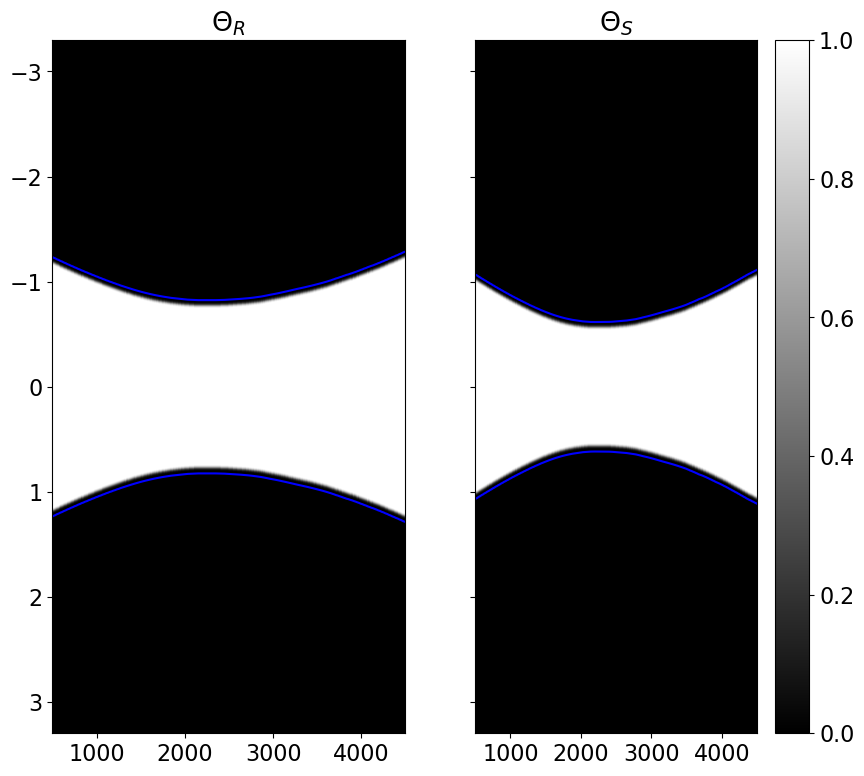

In [19]:
fig, ax = plt.subplots(1, 2,  sharey=True, figsize=(10, 9))
ax[0].imshow(wr.T, cmap='gray', extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
ax[0].plot(r[0], FirstVSr,'b'),ax[0].plot(r[0], -FirstVSr,'b')
ax[0].set_title(r'$\Theta_R$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
ax[0].axis('tight')
im=ax[1].imshow(ws.T, cmap='gray', extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
ax[1].plot(s[0], FirstVSs,'b'),ax[1].plot(s[0], -FirstVSs,'b')
ax[1].set_title(r'$\Theta_S$'), axs[1].set_xlabel(r'$x_R$'), axs[1].set_ylabel(r'$t$')
ax[1].axis('tight')

fig.colorbar(im,ax=ax[1]);

## Inversion with full receiver axis

In [20]:
# Add negative time to Pu operators
Putwosided = np.concatenate((np.zeros((nr, ns, nt-1)), Pu), axis=-1)         # Puw[r, s, t]
Putwosided_fft = np.fft.rfft(Putwosided, 2*nt-1, axis=-1) / np.sqrt(2*nt-1)
Putwosided_fft = Putwosided_fft[...,:nfmax]
Putwosided_fft = Putwosided_fft.transpose(2, 0, 1)                           # Puw[f, r, s]

# Operators
Puop = MDC(Putwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True)
dottest(Puop, (2*nt-1)*nr, (2*nt-1)*ns, verb=True)                      

Pu1op = MDC(Putwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True, conj=True)
dottest(Pu1op, (2*nt-1)*nr, (2*nt-1)*ns, verb=True)                        

Dot test passed, v^H(Opu)=-13.000414042444127 - u^H(Op^Hv)=-13.000414042443595
Dot test passed, v^H(Opu)=-92.1104873545438 - u^H(Op^Hv)=-92.11048735454305


True

In [23]:
# Add negative time to Pd operators
Pdtwosided = np.concatenate((np.zeros((nr, ns, nt-1)), Pd), axis=-1)         # Pd[r, s, t]
Pdtwosided_fft = np.fft.rfft(Pdtwosided, 2*nt-1, axis=-1) / np.sqrt(2*nt-1)
Pdtwosided_fft = Pdtwosided_fft[...,:nfmax]
Pdtwosided_fft = Pdtwosided_fft.transpose(2, 0, 1)                           # Pd[f, r, s]

# Operators
Pdop = MDC(Pdtwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True)
dottest(Pdop, (2*nt-1)*nr, (2*nt-1)*ns, verb=True)                           # [(2*nt-1)*ns, (2*nt-1)*nr]

Pd1op = MDC(Pdtwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True, conj=True)
dottest(Pd1op, (2*nt-1)*nr, (2*nt-1)*ns, verb=True)                          # [(2*nt-1)*ns, (2*nt-1)*nr]

Dot test passed, v^H(Opu)=-200.7500412626254 - u^H(Op^Hv)=-200.75004126262473
Dot test passed, v^H(Opu)=-447.39076284831697 - u^H(Op^Hv)=-447.39076284831646


True

In [24]:
# G0
G0sub_ana = directwave(wav[wav_c-wav_c:wav_c+wav_c], FirstVSs, nt, dt, nfft=2**11)
# Input focusing function
fd_plus =  np.concatenate((np.flipud(G0sub_ana), np.zeros((nt-1, ns))))

In [25]:
# Create Marchenko operator
Rollop = Roll((2*nt-1) * nr,
              axis=0, shift=-1)
Wxsop = Diagonal(ws.T.flatten())
Wxrop = Diagonal(wr.T.flatten())

Dop = VStack([HStack([Wxrop*Pdop, Wxrop*Puop]),
              HStack([Wxrop*Rollop*Pu1op, Wxrop*Rollop*Pd1op])])
Mop = Dop*BlockDiag([Wxsop, Wxsop])
Gop = VStack([HStack([Pdop, Puop]),
              HStack([Rollop*Pu1op, Rollop*Pd1op])])

dottest(Gop, 2*nr*(2*nt-1), 2*ns*(2*nt-1), verb=True)
dottest(Mop, 2*nr*(2*nt-1), 2*ns*(2*nt-1), verb=True);

Dot test passed, v^H(Opu)=995.8615806577101 - u^H(Op^Hv)=995.8615806577105
Dot test passed, v^H(Opu)=-0.01144192988299153 - u^H(Op^Hv)=-0.011441929882778368


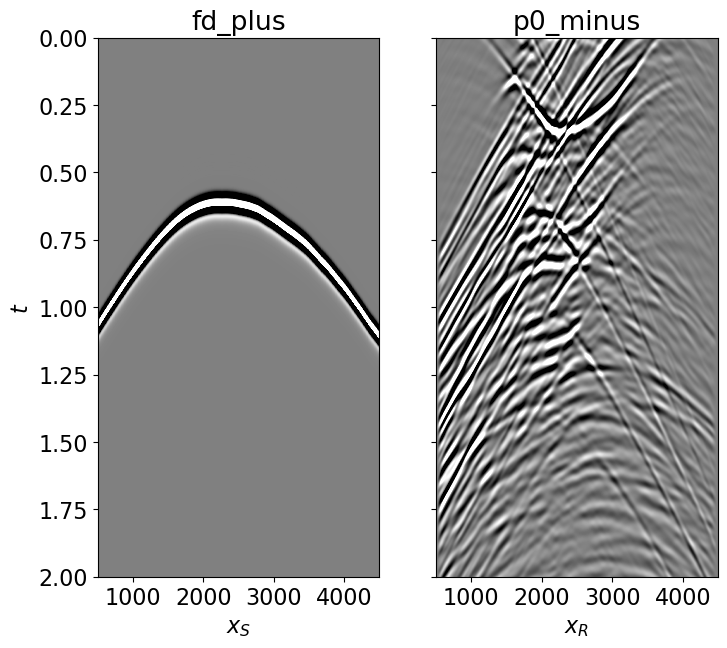

In [26]:
# Create single-scattering upgoing field (just backpropagate direct wave)
p0_minus = Puop*fd_plus.ravel()
p0_minus = p0_minus.reshape((2*nt-1), nr).T

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(8, 7))
axs[0].imshow(np.flipud(fd_plus), cmap='gray', vmin=-0.1*np.abs(fd_plus).max(), 
              vmax=0.1*np.abs(fd_plus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[0].set_title('fd_plus'), axs[0].set_xlabel(r'$x_S$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(2, 0)
axs[1].imshow(p0_minus.T, cmap='gray', vmin=-0.1*np.abs(p0_minus).max(), 
              vmax=0.1*np.abs(p0_minus).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[1].set_title('p0_minus'), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

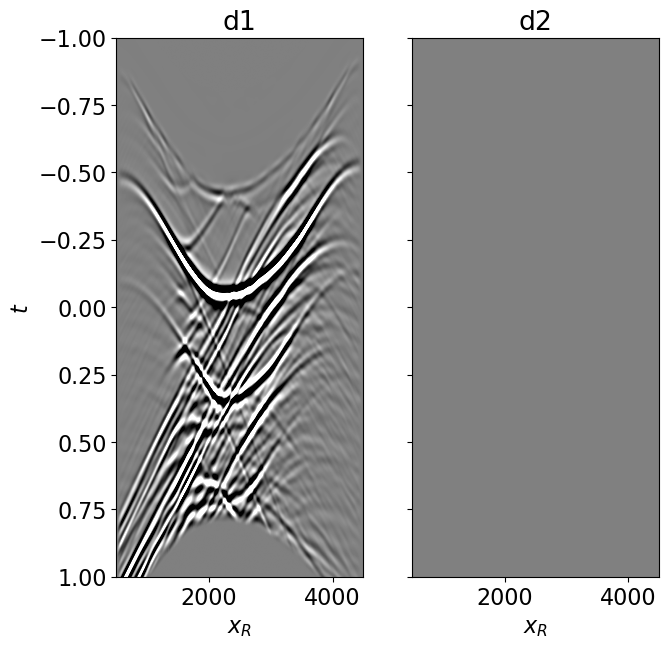

In [27]:
# Create data
dinp = np.concatenate((np.zeros((2*nt-1, ns)), fd_plus), axis=0)
d = -Dop * dinp.ravel()
d = d.reshape(2*(2*nt-1), nr)
d[(2*nt-1):, :] = 0 # remove artefact in second term of d

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(7, 7))
axs[0].imshow(d[:(2*nt-1)], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d1'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(1, -1)
axs[1].imshow(d[(2*nt-1):], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[1].set_title('d2'), axs[1].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[1].axis('tight')
axs[1].set_ylim(1, -1);

In [28]:
# Adjoint and inverse
f1_adj = Mop.H*d.ravel()
f1_inv = lsqr(Mop, d.ravel(), iter_lim=n_iter, show=True)[0]

f1_adj = f1_adj.reshape(2*(2*nt-1), ns)
f1_inv = f1_inv.reshape(2*(2*nt-1), ns)

 
LSQR            Least-squares solution of  Ax = b
The matrix A has 1759200 rows and 1763598 columns
damp = 0.00000000000000e+00   calc_var =        0
atol = 1.00e-06                 conlim = 1.00e+08
btol = 1.00e-06               iter_lim =       10
 
   Itn      x[0]       r1norm     r2norm   Compatible    LS      Norm A   Cond A
     0  0.00000e+00   1.853e+03  1.853e+03    1.0e+00  4.6e-04
     1  0.00000e+00   1.154e+03  1.154e+03    6.2e-01  7.6e-01   1.1e+00  1.0e+00
     2  0.00000e+00   7.983e+02  7.983e+02    4.3e-01  4.2e-01   1.7e+00  2.3e+00
     3  0.00000e+00   6.385e+02  6.385e+02    3.4e-01  2.3e-01   2.2e+00  3.8e+00
     4  0.00000e+00   5.595e+02  5.595e+02    3.0e-01  1.7e-01   2.5e+00  5.2e+00
     5  0.00000e+00   5.123e+02  5.123e+02    2.8e-01  1.2e-01   2.9e+00  6.9e+00
     6  0.00000e+00   4.757e+02  4.757e+02    2.6e-01  1.2e-01   3.1e+00  8.9e+00
     7  0.00000e+00   4.354e+02  4.354e+02    2.3e-01  1.1e-01   3.4e+00  1.1e+01
     8  0.00000e+00   4.035e

Add initial guess to estimated focusing functions

In [29]:
f1_adj_tot = f1_adj + np.concatenate((np.zeros((2*nt-1, ns)),
                                      np.concatenate((np.fliplr(G0sub_ana.T).T, 
                                                      np.zeros((nt-1, ns))), axis=0)))
f1_inv_tot = f1_inv + np.concatenate((np.zeros((2*nt-1, ns)), fd_plus))

Estimate Green's functions

In [30]:
g_adj = Gop*f1_adj_tot.flatten()
g_inv = Gop*f1_inv_tot.flatten()

g_adj = g_adj.reshape(2*(2*nt-1), nr)
g_inv = g_inv.reshape(2*(2*nt-1), nr)

Extract up and down focusing and Green's functions from model vectors

In [31]:
f1_adj_minus, f1_adj_plus =  f1_adj_tot[:(2*nt-1)].T, f1_adj_tot[(2*nt-1):].T
f1_inv_minus, f1_inv_plus =  f1_inv_tot[:(2*nt-1)].T, f1_inv_tot[(2*nt-1):].T

g_adj_minus, g_adj_plus =  -g_adj[:(2*nt-1)].T, np.fliplr(g_adj[(2*nt-1):].T)
g_inv_minus, g_inv_plus =  -g_inv[:(2*nt-1)].T, np.fliplr(g_inv[(2*nt-1):].T)

g_inv_tot = g_inv_minus + g_inv_plus

Visualization

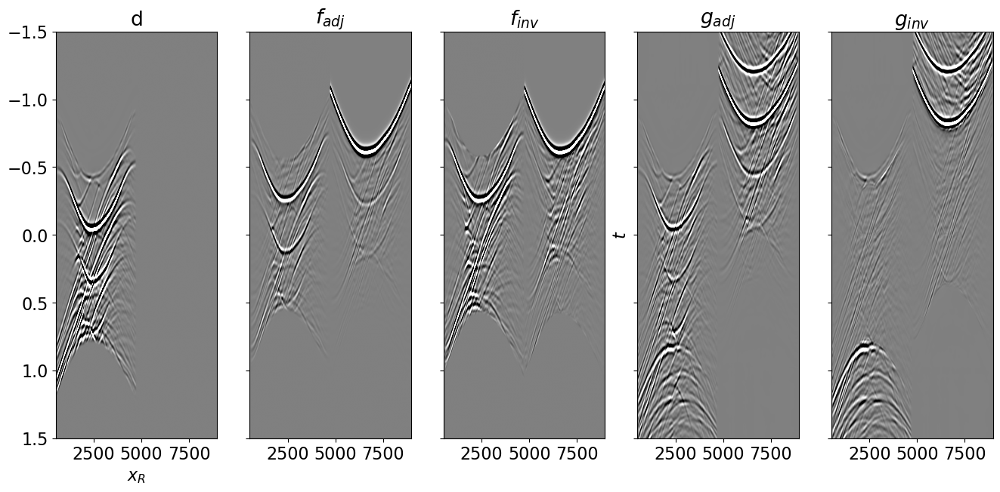

In [32]:
d_plot = np.concatenate((d[:(2*nt-1)], d[(2*nt-1):]), axis=1).T
f1_adj_tot_plot = np.concatenate((f1_adj_tot[:(2*nt-1)], f1_adj_tot[(2*nt-1):]), axis=1).T
f1_inv_tot_plot = np.concatenate((f1_inv_tot[:(2*nt-1)], f1_inv_tot[(2*nt-1):]), axis=1).T
g_adj_plot = np.concatenate((g_adj[:(2*nt-1)], g_adj[(2*nt-1):]), axis=1).T
g_inv_plot = np.concatenate((g_inv[:(2*nt-1)], g_inv[(2*nt-1):]), axis=1).T

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(16, 7))
axs[0].imshow(d_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d'), axs[0].set_xlabel(r'$x_R$'), axs[3].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(f1_adj_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_adj_tot).max(), 
              vmax=0.1*np.abs(f1_adj_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$f_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(f1_inv_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_tot).max(), 
              vmax=0.1*np.abs(f1_inv_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$f_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(g_adj_plot.T, cmap='gray', vmin=-0.1*np.abs(g_adj).max(), 
              vmax=0.1*np.abs(g_adj).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[3].set_title(r'$g_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow(g_inv_plot.T, cmap='gray', vmin=-0.1*np.abs(g_inv).max(), 
              vmax=0.1*np.abs(g_inv).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[4].set_title(r'$g_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(1.5, -1.5);

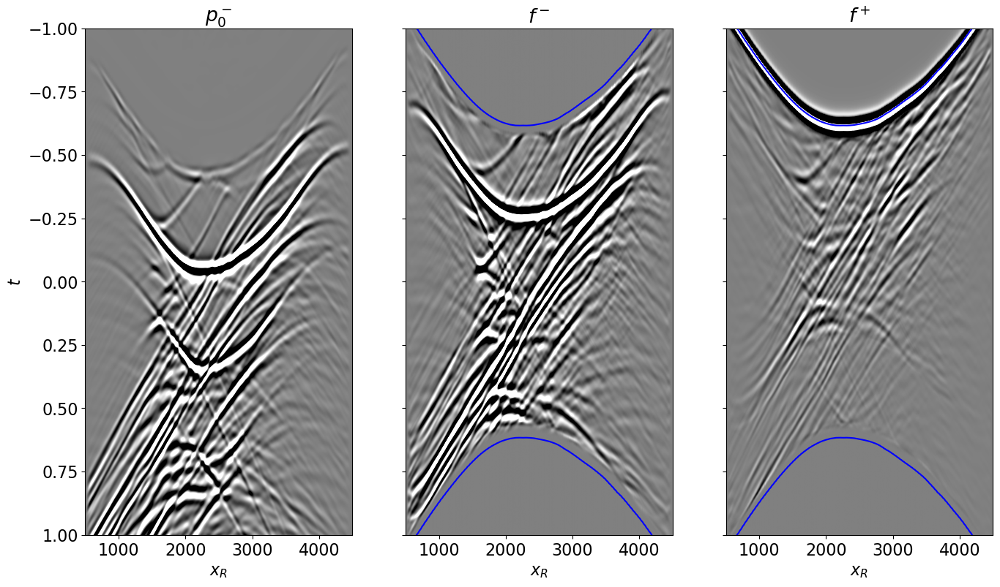

In [35]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(16, 9))
axs[0].imshow(p0_minus.T, cmap='gray', vmin=-0.1*np.abs(p0_minus).max(), 
              vmax=0.1*np.abs(p0_minus).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[0].set_title(r'$p_0^-$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
# axs[0].plot(r[0], FirstVSs,'b'),axs[0].plot(r[0], -FirstVSs,'b')
axs[0].axis('tight')
axs[0].set_ylim(1, -1);
axs[1].imshow(f1_inv_minus.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_minus).max(), 
              vmax=0.1*np.abs(f1_inv_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$f^-$'), axs[1].set_xlabel(r'$x_R$')
axs[1].plot(s[0], FirstVSs,'b'),axs[1].plot(s[0], -FirstVSs,'b')
axs[1].axis('tight')
axs[1].set_ylim(1, -1);
axs[2].imshow(f1_inv_plus.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_plus).max(), 
              vmax=0.1*np.abs(f1_inv_plus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$f^+$'), axs[2].set_xlabel(r'$x_R$')
axs[2].plot(s[0], FirstVSs,'b'),axs[2].plot(s[0], -FirstVSs,'b')
axs[2].axis('tight')
axs[2].set_ylim(1, -1);

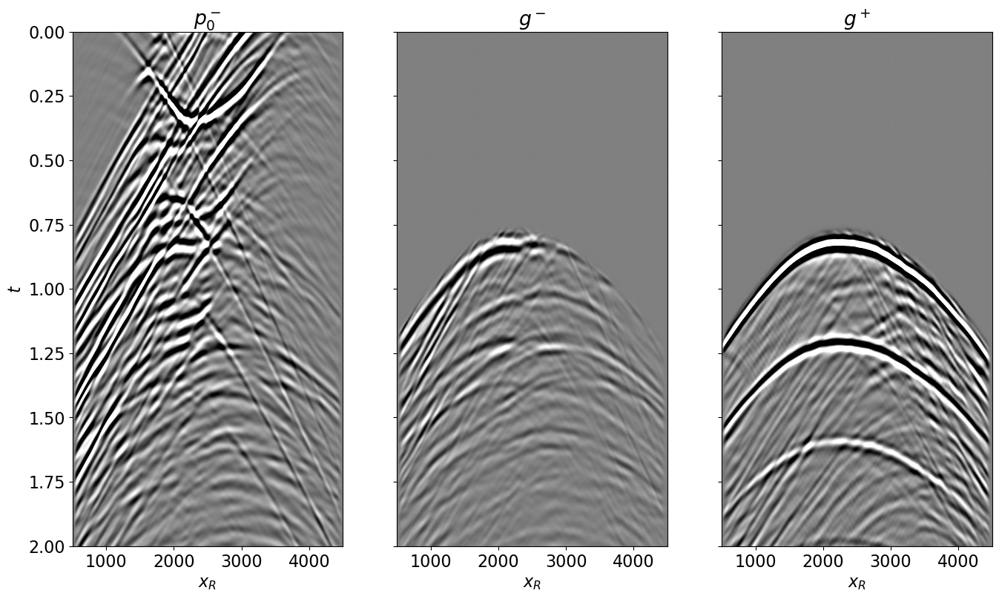

In [36]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(16, 9))
axs[0].imshow(p0_minus.T, cmap='gray', vmin=-0.1*np.abs(p0_minus).max(), 
              vmax=0.1*np.abs(p0_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[0].set_title(r'$p_0^-$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow((1-wr.T) * g_inv_minus.T, cmap='gray', vmin=-0.1*np.abs(g_inv_plus+g_inv_minus).max(), 
              vmax= 0.1*np.abs(g_inv_plus+g_inv_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$g^-$'), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);
axs[2].imshow((1-wr.T) * g_inv_plus.T, cmap='gray', vmin=-0.1*np.abs(g_inv_plus+g_inv_minus).max(), 
              vmax=0.1*np.abs(g_inv_plus+g_inv_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$g^+$'), axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[2].set_ylim(2, 0);

In [37]:
inputfile = '/home/wangn0e/2022-2023/first_research/upside_down_RM_1version/overthrustRM15_x2200z1206.npy' 
g_true = np.load(inputfile)

g_true = dt * np.apply_along_axis(convolve, -1, g_true, wav, mode='full')
g_true = g_true[..., wav_c:][..., :nt]
g_true = g_true[0,:-1]
g_true = -(1-wr[:, nt-1:]) *g_true/g_true.max()

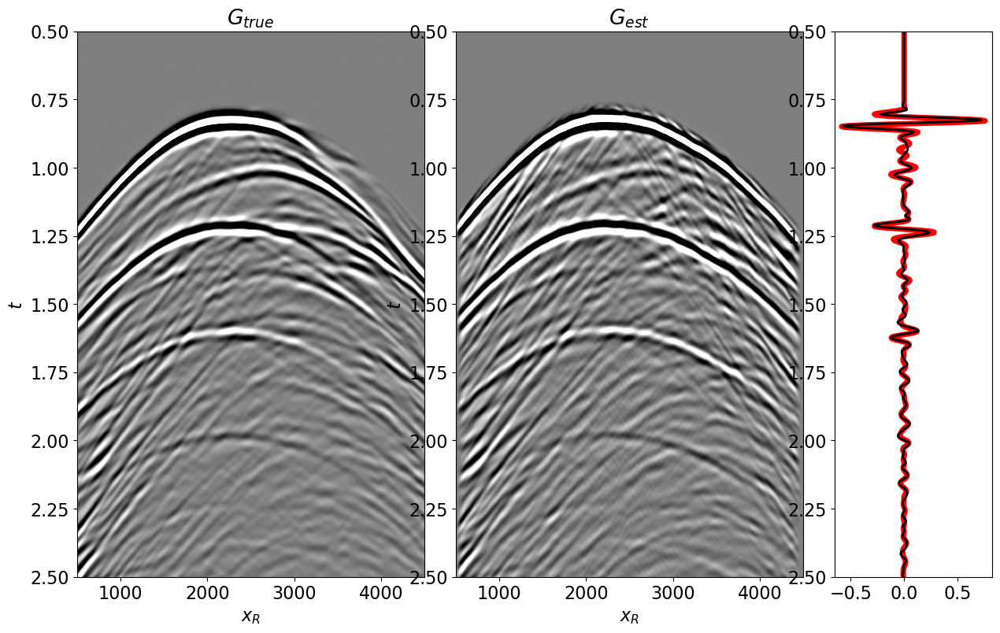

In [38]:
fig = plt.figure(figsize=(15,9))
ax1 = plt.subplot2grid((1, 5), (0, 0), colspan=2)
ax2 = plt.subplot2grid((1, 5), (0, 2), colspan=2)
ax3 = plt.subplot2grid((1, 5), (0, 4))

g_inv_tot_norm = (1-wr[:, nt-1:]) * (g_inv_tot[:, nt-1:])/(g_inv_tot).max()

ax1.imshow(g_true.T, cmap='gray', vmin=-0.1*np.abs(g_true).max(), 
           vmax=0.1*np.abs(g_true).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'$G_{true}$'), ax1.set_xlabel(r'$x_R$'), ax1.set_ylabel(r'$t$')
ax1.axis('tight')
ax1.set_ylim(2.5, 0.5)
ax2.imshow(g_inv_tot_norm.T, cmap='gray', vmin=-0.1*np.abs(g_inv_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'$G_{est}$'), ax2.set_xlabel(r'$x_R$'), ax2.set_ylabel(r'$t$')
ax2.axis('tight')
ax2.set_ylim(2.5, 0.5)

ax3.plot((g_true[ns//2,:])/(g_true).max(), t, 'r', lw=5)
ax3.plot((g_inv_tot_norm[ns//2, :])/(g_inv_tot_norm).max(), t, 'k', lw=2)
ax3.set_ylim(2.5, 0.5);

## Inversion with sparse receivers

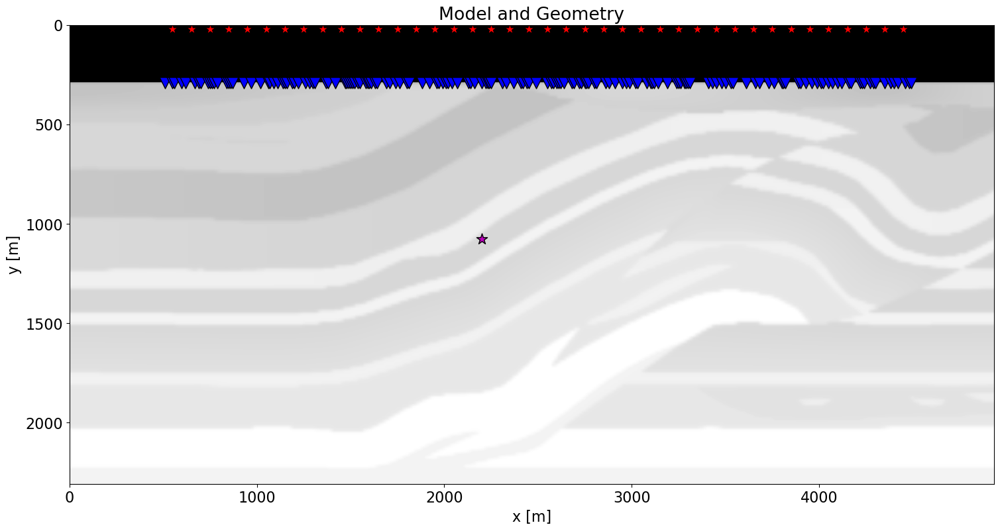

In [39]:
np.random.seed(10)

# subsampling
perc_subsampling=0.4 # percentage of subsampling
nrava=int(np.round(nr*perc_subsampling))
ishuffle = np.random.permutation(np.arange(nr))
iava = np.sort(ishuffle[:nrava])
inotava = np.sort(ishuffle[nrava:])

plt.figure(figsize=(18,9))
plt.imshow(rho, cmap='gray', extent = (x[0], x[-1], z[-1], z[0]))
plt.scatter(s[0, 5::10], s[1, 5::10], marker='*', s=150, c='r', edgecolors='k')
plt.scatter(r[0, iava],  r[1, iava], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(vs[0], vs[1], marker='*', s=150, c='m', edgecolors='k')
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]'),plt.title('Model and Geometry')
plt.xlim(x[0], x[-1]);

In [40]:
# Add negative time to Pu operators
Putwosided = np.concatenate((np.zeros((nr, ns, nt-1)), Pu), axis=-1)         # Puw[r, s, t]
Putwosided_fft = np.fft.rfft(Putwosided, 2*nt-1, axis=-1) / np.sqrt(2*nt-1)
Putwosided_fft = Putwosided_fft[...,:nfmax]
Putwosided_fft = Putwosided_fft.transpose(2, 0, 1)                           # Puw[f, r, s]
Putwosided_fft = Putwosided_fft[:, iava]

# Operators
Puop = MDC(Putwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True)
dottest(Puop, (2*nt-1)*nrava, (2*nt-1)*ns, verb=True)                      

Pu1op = MDC(Putwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True, conj=True)
dottest(Pu1op, (2*nt-1)*nrava, (2*nt-1)*ns, verb=True)                      

Dot test passed, v^H(Opu)=73.42654782957781 - u^H(Op^Hv)=73.42654782957788
Dot test passed, v^H(Opu)=67.3520428627611 - u^H(Op^Hv)=67.35204286276065


True

In [41]:
# Add negative time to Pd operators
Pdtwosided = np.concatenate((np.zeros((nr, ns, nt-1)), Pd), axis=-1)         # Pd[r, s, t]
Pdtwosided_fft = np.fft.rfft(Pdtwosided, 2*nt-1, axis=-1) / np.sqrt(2*nt-1)
Pdtwosided_fft = Pdtwosided_fft[...,:nfmax]
Pdtwosided_fft = Pdtwosided_fft.transpose(2, 0, 1)                           # Pd[f, r, s]
Pdtwosided_fft = Pdtwosided_fft[:, iava]

# Operators
Pdop = MDC(Pdtwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True)
dottest(Pdop, (2*nt-1)*nrava, (2*nt-1)*ns, verb=True)                         

Pd1op = MDC(Pdtwosided_fft, nt=2*nt-1, nv=1, dt=dt, dr=ds, twosided=True, conj=True)
dottest(Pd1op, (2*nt-1)*nrava, (2*nt-1)*ns, verb=True)                   

Dot test passed, v^H(Opu)=202.82116658097198 - u^H(Op^Hv)=202.821166580972
Dot test passed, v^H(Opu)=-331.8245230771573 - u^H(Op^Hv)=-331.8245230771575


True

In [42]:
# Input focusing function
fd_plus =  np.concatenate((np.flipud(G0sub_ana), np.zeros((nt-1, ns))))

In [43]:
# Create Marchenko operator
Rollop = Roll((2*nt-1) * nrava,
              axis=0, shift=-1)
Wxsop = Diagonal(ws.T.flatten())
Wxrop = Diagonal(wr[iava].T.flatten())

Dop = VStack([HStack([Wxrop*Pdop, Wxrop*Puop]),
              HStack([Wxrop*Rollop*Pu1op, Wxrop*Rollop*Pd1op])])
Mop = Dop*BlockDiag([Wxsop, Wxsop])
Gop = VStack([HStack([Pdop, Puop]),
              HStack([Rollop*Pu1op, Rollop*Pd1op])])

dottest(Gop, 2*nrava*(2*nt-1), 2*ns*(2*nt-1), verb=True)
dottest(Mop, 2*nrava*(2*nt-1), 2*ns*(2*nt-1), verb=True);

Dot test passed, v^H(Opu)=-1.3230282027748572 - u^H(Op^Hv)=-1.3230282027724343
Dot test passed, v^H(Opu)=49.22334213246278 - u^H(Op^Hv)=49.22334213246272


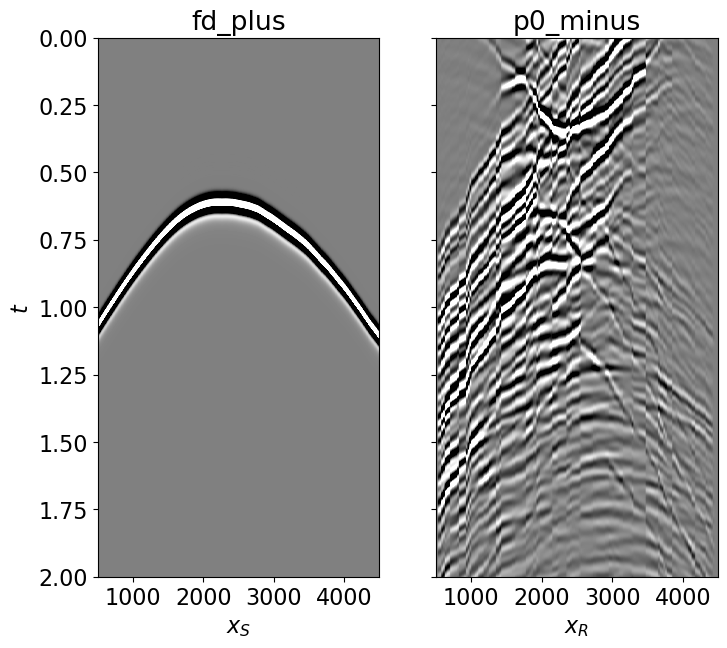

In [44]:
# Create single-scattering upgoing field (just backpropagate direct wave)
p0_minus_subl2 = Puop*fd_plus.ravel()
p0_minus_subl2 = p0_minus_subl2.reshape((2*nt-1), nrava).T

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(8, 7))
axs[0].imshow(np.flipud(fd_plus), cmap='gray', vmin=-0.1*np.abs(fd_plus).max(), 
              vmax=0.1*np.abs(fd_plus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[0].set_title('fd_plus'), axs[0].set_xlabel(r'$x_S$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(2, 0)
axs[1].imshow(p0_minus_subl2.T, cmap='gray', vmin=-0.1*np.abs(p0_minus).max(), 
              vmax=0.1*np.abs(p0_minus).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[1].set_title('p0_minus'), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

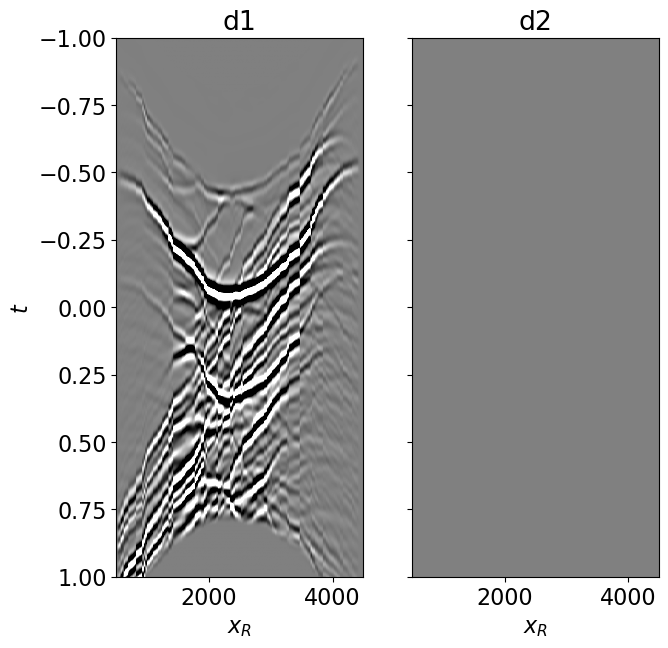

In [45]:
# Create data
dinp = np.concatenate((np.zeros((2*nt-1, ns)), fd_plus), axis=0)
d = -Dop * dinp.ravel()
d = d.reshape(2*(2*nt-1), nrava)
d[(2*nt-1):, :] = 0 # remove artefact in second term of d

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(7, 7))
axs[0].imshow(d[:(2*nt-1)], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d1'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(1, -1)
axs[1].imshow(d[(2*nt-1):], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[1].set_title('d2'), axs[1].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[1].axis('tight')
axs[1].set_ylim(1, -1);

### L2 inversion

In [46]:
f1_adj_subl2 = Mop.H*d.ravel()
f1_inv_subl2 = lsqr(Mop, d.ravel(), iter_lim=n_iter, show=True)[0]

f1_adj_subl2 = f1_adj_subl2.reshape(2*(2*nt-1), ns)
f1_inv_subl2 = f1_inv_subl2.reshape(2*(2*nt-1), ns)

 
LSQR            Least-squares solution of  Ax = b
The matrix A has 703680 rows and 1763598 columns
damp = 0.00000000000000e+00   calc_var =        0
atol = 1.00e-06                 conlim = 1.00e+08
btol = 1.00e-06               iter_lim =       10
 
   Itn      x[0]       r1norm     r2norm   Compatible    LS      Norm A   Cond A
     0  0.00000e+00   1.192e+03  1.192e+03    1.0e+00  5.0e-04
     1  0.00000e+00   7.305e+02  7.305e+02    6.1e-01  7.4e-01   7.5e-01  1.0e+00
     2  0.00000e+00   5.085e+02  5.085e+02    4.3e-01  4.0e-01   1.2e+00  2.3e+00
     3  0.00000e+00   4.031e+02  4.031e+02    3.4e-01  2.5e-01   1.5e+00  3.7e+00
     4  0.00000e+00   3.425e+02  3.425e+02    2.9e-01  1.9e-01   1.7e+00  5.3e+00
     5  0.00000e+00   3.053e+02  3.053e+02    2.6e-01  1.4e-01   1.9e+00  7.0e+00
     6  0.00000e+00   2.798e+02  2.798e+02    2.3e-01  1.3e-01   2.1e+00  8.8e+00
     7  0.00000e+00   2.579e+02  2.579e+02    2.2e-01  1.1e-01   2.3e+00  1.1e+01
     8  0.00000e+00   2.401e+

In [47]:
f1_adj_subl2_tot = f1_adj_subl2 + np.concatenate((np.zeros((2*nt-1, ns)),
                                      np.concatenate((np.fliplr(G0sub_ana.T).T, 
                                                      np.zeros((nt-1, ns))), axis=0)))
f1_inv_subl2_tot = f1_inv_subl2 + np.concatenate((np.zeros((2*nt-1, ns)),
                                      fd_plus))

In [48]:
g_adj_subl2 = Gop*f1_adj_subl2_tot.flatten()
g_inv_subl2 = Gop*f1_inv_subl2_tot.flatten()

g_adj_subl2 = g_adj_subl2.reshape(2*(2*nt-1), nrava)
g_inv_subl2 = g_inv_subl2.reshape(2*(2*nt-1), nrava)

In [49]:
f1_adj_subl2_minus, f1_adj_subl2_plus =  f1_adj_subl2_tot[:(2*nt-1)].T, f1_adj_subl2_tot[(2*nt-1):].T
f1_inv_subl2_minus, f1_inv_subl2_plus =  f1_inv_subl2_tot[:(2*nt-1)].T, f1_inv_subl2_tot[(2*nt-1):].T

g_adj_subl2_minus, g_adj_subl2_plus =  -g_adj_subl2[:(2*nt-1)].T, np.fliplr(g_adj_subl2[(2*nt-1):].T)
g_inv_subl2_minus, g_inv_subl2_plus =  -g_inv_subl2[:(2*nt-1)].T, np.fliplr(g_inv_subl2[(2*nt-1):].T)

g_inv_subl2_tot = g_inv_subl2_minus + g_inv_subl2_plus

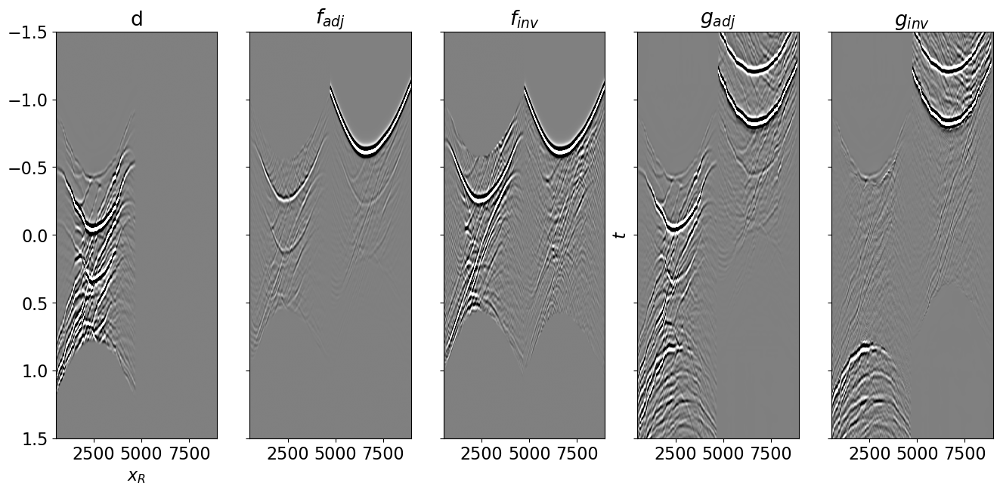

In [50]:
d_plot = np.concatenate((d[:(2*nt-1)], d[(2*nt-1):]), axis=1).T
f1_adj_subl2_tot_plot = np.concatenate((f1_adj_subl2_tot[:(2*nt-1)], f1_adj_subl2_tot[(2*nt-1):]), axis=1).T
f1_inv_subl2_tot_plot = np.concatenate((f1_inv_subl2_tot[:(2*nt-1)], f1_inv_subl2_tot[(2*nt-1):]), axis=1).T
g_adj_subl2_plot = np.concatenate((g_adj_subl2[:(2*nt-1)], g_adj_subl2[(2*nt-1):]), axis=1).T
g_inv_subl2_plot = np.concatenate((g_inv_subl2[:(2*nt-1)], g_inv_subl2[(2*nt-1):]), axis=1).T

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(16, 7))
axs[0].imshow(d_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d'), axs[0].set_xlabel(r'$x_R$'), axs[3].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(f1_adj_subl2_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_adj_tot).max(), 
              vmax=0.1*np.abs(f1_adj_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$f_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(f1_inv_subl2_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_tot).max(), 
              vmax=0.1*np.abs(f1_inv_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$f_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(g_adj_subl2_plot.T, cmap='gray', vmin=-0.1*np.abs(g_adj).max(), 
              vmax=0.1*np.abs(g_adj).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[3].set_title(r'$g_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow(g_inv_subl2_plot.T, cmap='gray', vmin=-0.1*np.abs(g_inv).max(), 
              vmax=0.1*np.abs(g_inv).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[4].set_title(r'$g_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(1.5, -1.5);

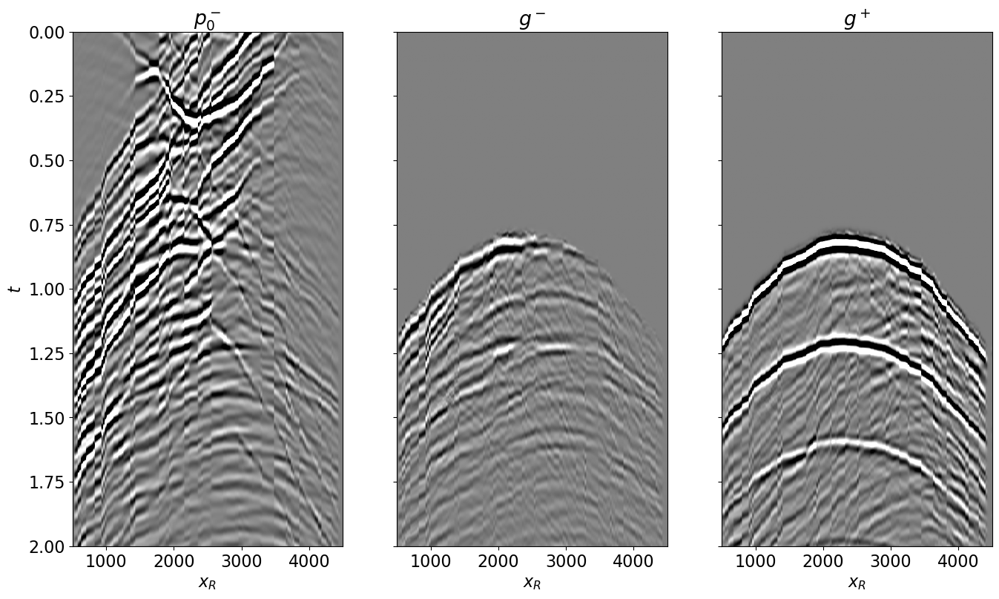

In [51]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(16, 9))
axs[0].imshow(p0_minus_subl2.T, cmap='gray', vmin=-0.1*np.abs(p0_minus).max(), 
              vmax=0.1*np.abs(p0_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[0].set_title(r'$p_0^-$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow((1-wr[iava].T) * g_inv_subl2_minus.T, cmap='gray', vmin=-0.1*np.abs(g_inv_plus+g_inv_minus).max(), 
              vmax= 0.1*np.abs(g_inv_plus+g_inv_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$g^-$'), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);
axs[2].imshow((1-wr[iava].T) * g_inv_subl2_plus.T, cmap='gray', vmin=-0.1*np.abs(g_inv_plus+g_inv_minus).max(), 
              vmax=0.1*np.abs(g_inv_plus+g_inv_minus).max(), extent=(s[0,0], s[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$g^+$'), axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[2].set_ylim(2, 0);

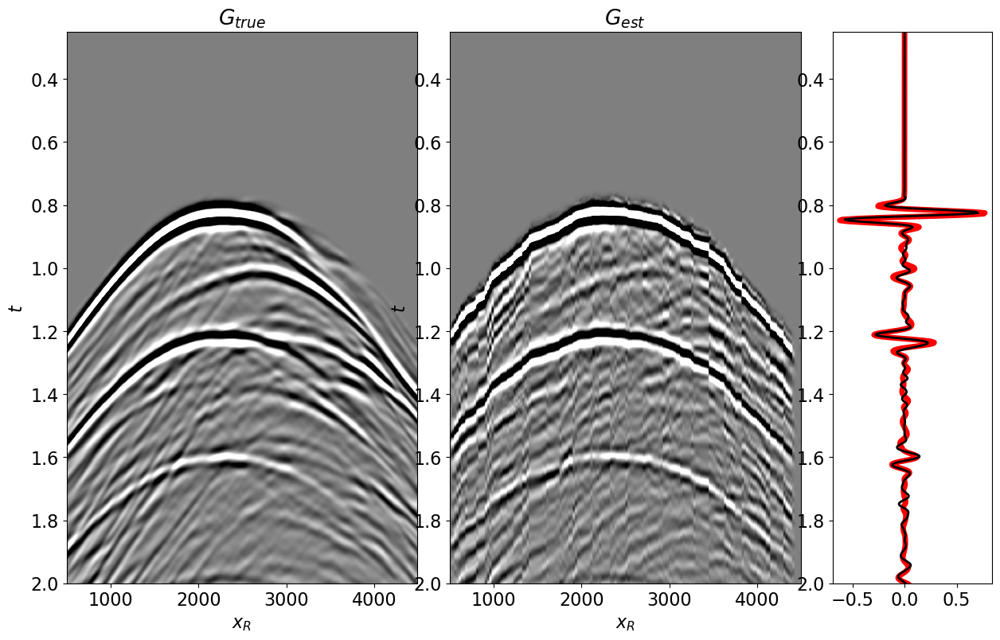

In [52]:
fig = plt.figure(figsize=(15,9))
ax1 = plt.subplot2grid((1, 5), (0, 0), colspan=2)
ax2 = plt.subplot2grid((1, 5), (0, 2), colspan=2)
ax3 = plt.subplot2grid((1, 5), (0, 4))

g_inv_subl2_tot_norm = (1-wr[iava, nt-1:]) * (g_inv_subl2_tot[:, nt-1:])/(g_inv_tot).max()

ax1.imshow(g_true.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl2_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl2_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'$G_{true}$'), ax1.set_xlabel(r'$x_R$'), ax1.set_ylabel(r'$t$')
ax1.axis('tight')
ax1.set_ylim(2, 0.25)
ax2.imshow(g_inv_subl2_tot_norm.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl2_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl2_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'$G_{est}$'), ax2.set_xlabel(r'$x_R$'), ax2.set_ylabel(r'$t$')
ax2.axis('tight')
ax2.set_ylim(2, 0.25)

ax3.plot((g_true[iava[nrava//2],:])/(g_true).max(), t, 'r', lw=5)
ax3.plot((g_inv_subl2_tot_norm[nrava//2, :])/(g_inv_subl2_tot_norm).max(), t, 'k', lw=2)
ax3.set_ylim(2, 0.25);

### L2 inversion with Radon sparsity

In [53]:
t_ = np.arange(nt)*dt
t2 = np.concatenate([-t_[::-1], t_[1:]])
nt2 = len(t2)

In [82]:
nwin = 32
nover = 14
step = nwin - nover
starts = np.arange(0, ns - nwin + 1, step, dtype=int)
nwins = len(starts)

npx=nwin
pxmax = 2e-3
px = np.linspace(-pxmax, pxmax, npx)
dimsd = (ns, nt2) 
dimss = (nwins*npx, dimsd[1])

R2Op = ChirpRadon2D(t2, np.linspace(-ds*nwin//2, ds*nwin//2, nwin), 
                    pxmax*ds/dt, dtype='float64')

Slidop = Sliding2D(R2Op, dimss, dimsd, nwin, nover, tapertype='cosine')
dottest(Slidop, np.prod(dimsd), np.prod(dimss), verb=True);

# tranpose operator
Top = Transpose((nt2, ns), axes=(1, 0), dtype=np.float64)

# sliding window radon with overlap
Sparseop = BlockDiag([Top.H*Slidop, Top.H*Slidop])
Mop_radon = Mop * Sparseop
dottest(Mop_radon, 2*nrava*(2*nt-1), 2*np.prod(dimss), verb=True);

Dot test passed, v^H(Opu)=4891.374588513706 - u^H(Op^Hv)=4891.374588513716
Dot test passed, v^H(Opu)=38.26185976123452 - u^H(Op^Hv)=38.26185976123577


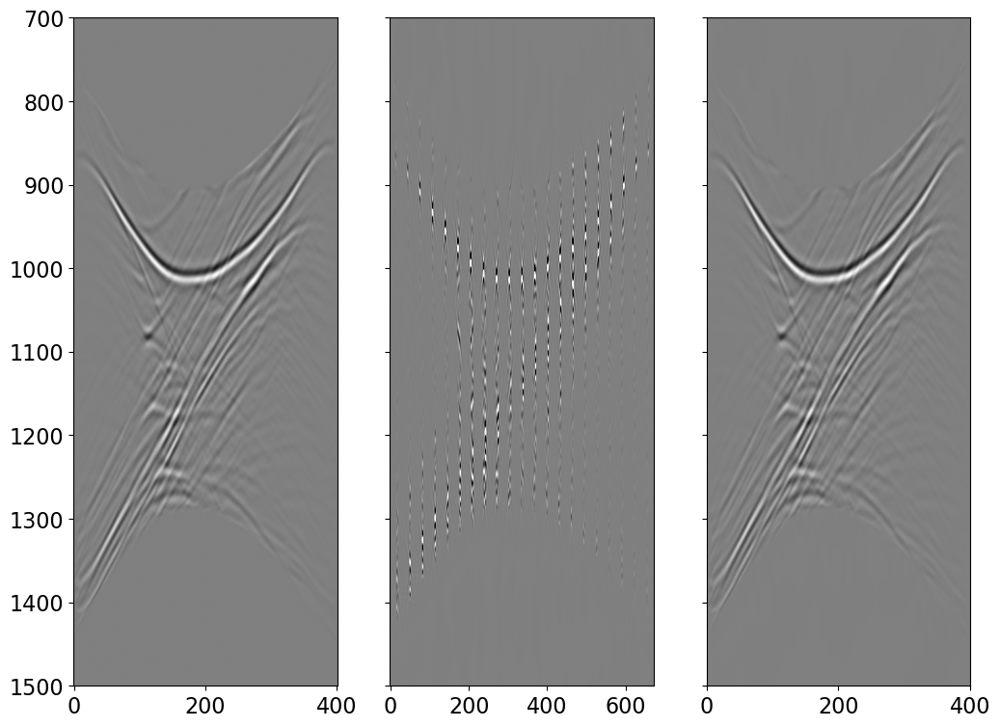

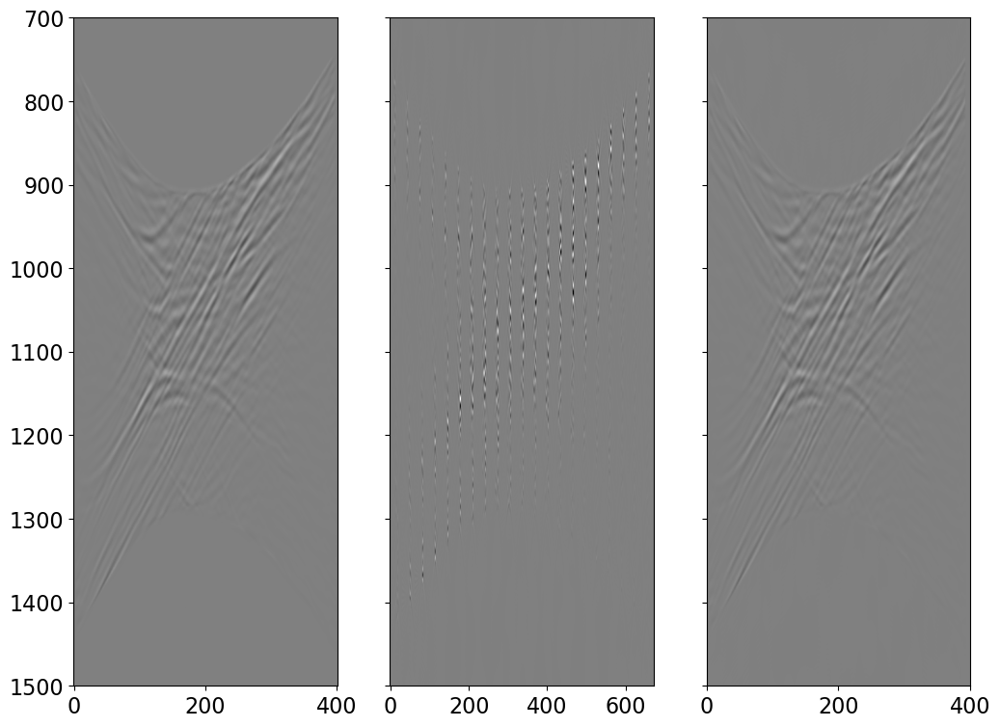

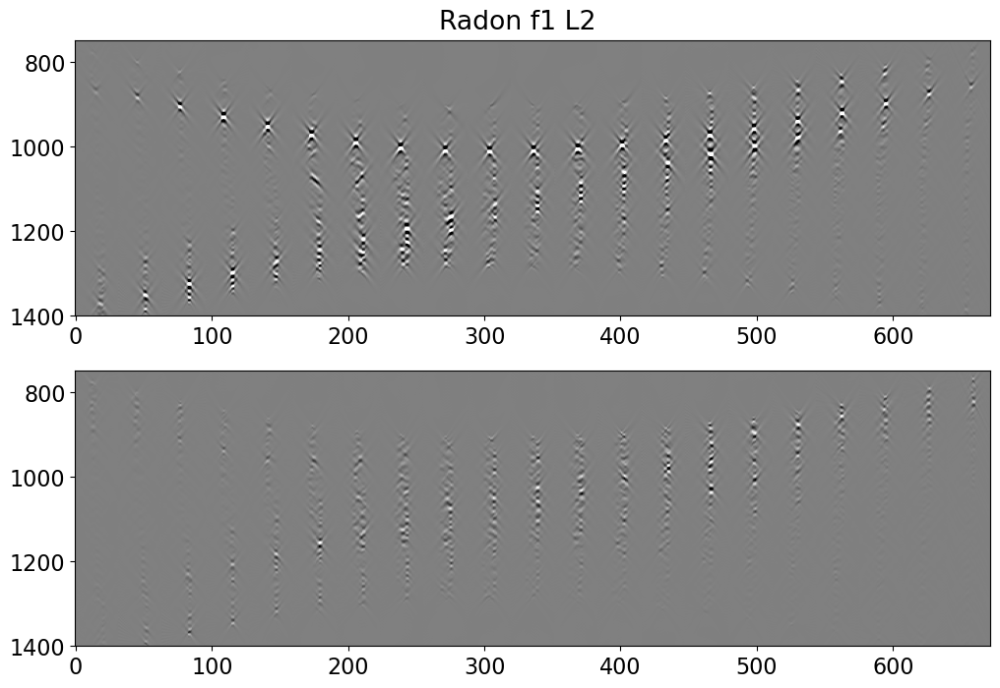

In [83]:
f1_minus_radon = Slidop.div(f1_inv_minus.flatten(), 10)
f1_minus_rec = Slidop @ f1_minus_radon
f1_minus_radon = f1_minus_radon.reshape(npx*nwins, nt2)
f1_minus_rec = f1_minus_rec.reshape(ns, nt2)

f1_plus_radon = Slidop.div((f1_inv_plus-fd_plus.T).flatten(), 10)
f1_plus_rec = Slidop @ f1_plus_radon
f1_plus_radon = f1_plus_radon.reshape(npx*nwins, nt2)
f1_plus_rec = f1_plus_rec.reshape(ns, nt2)

dpred_radon = Mop_radon @ np.hstack([f1_minus_radon.ravel(), f1_plus_radon.ravel()])
dpred_radon = dpred_radon.reshape(d.shape)

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(12, 9))
axs[0].imshow(f1_inv_minus.T, cmap='gray', vmin=-5e1, vmax=5e1)
axs[0].axis('tight')
axs[1].imshow(f1_minus_radon.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[1].axis('tight');
axs[2].imshow(f1_minus_rec.T, cmap='gray', vmin=-5e1, vmax=5e1)
axs[2].axis('tight')
axs[2].set_ylim(1500, 700)

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(12, 9))
axs[0].imshow((f1_inv_plus-fd_plus.T).T, cmap='gray', vmin=-5e1, vmax=5e1)
axs[0].axis('tight')
axs[1].imshow(f1_plus_radon.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[1].axis('tight');
axs[2].imshow(f1_plus_rec.T, cmap='gray', vmin=-5e1, vmax=5e1)
axs[2].axis('tight')
axs[2].set_ylim(1500, 700)

fig, axs = plt.subplots(2, 1, sharey=True, figsize=(12, 8))
fig.suptitle('Radon f1 L2', y=.92)
axs[0].imshow(f1_minus_radon.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[0].axis('tight')
axs[1].imshow(f1_plus_radon.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[1].axis('tight')
axs[1].set_ylim(1400, 750); 

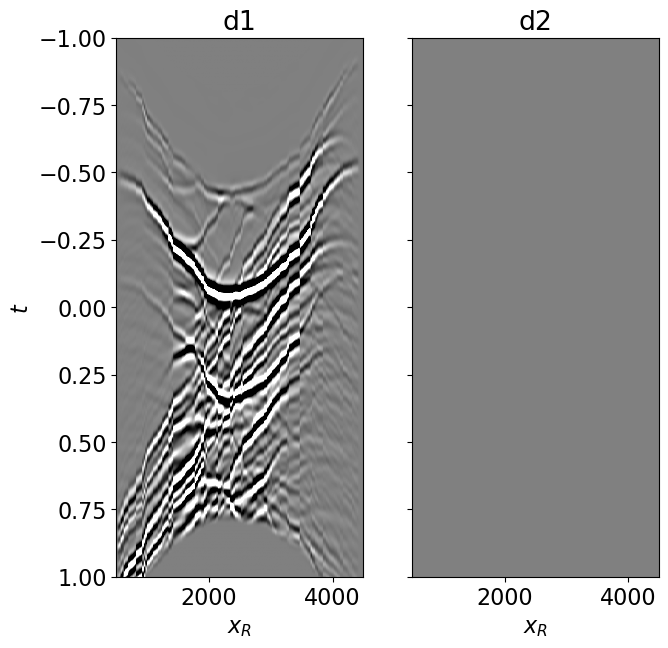

In [84]:
dinp = np.concatenate((np.zeros((2*nt-1, ns)), fd_plus), axis=0)
d = -Dop * dinp.ravel()
d = d.reshape(2*(2*nt-1), nrava)
d[(2*nt-1):, :] = 0 # remove artefact in second term of d

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(7, 7))
axs[0].imshow(d[:(2*nt-1)], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d1'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_ylim(1, -1)
axs[1].imshow(d[(2*nt-1):], cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], r[0,-1], t[-1], -t[-1]))
axs[1].set_title('d2'), axs[1].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[1].axis('tight')
axs[1].set_ylim(1, -1);

In [85]:
f1_inv_subl2radon_radon = lsqr(Mop_radon, d.ravel(), iter_lim=100, show=True)[0]
f1_inv_subl2radon = Sparseop * f1_inv_subl2radon_radon

f1_inv_subl2radon = f1_inv_subl2radon.reshape(2*nt2, ns)

dpred_inv_subl2radon = Mop_radon @ f1_inv_subl2radon_radon
dpred_inv_subl2radon = dpred_inv_subl2radon.reshape(d.shape)

 
LSQR            Least-squares solution of  Ax = b
The matrix A has 703680 rows and 2955456 columns
damp = 0.00000000000000e+00   calc_var =        0
atol = 1.00e-06                 conlim = 1.00e+08
btol = 1.00e-06               iter_lim =      100
 
   Itn      x[0]       r1norm     r2norm   Compatible    LS      Norm A   Cond A
     0  0.00000e+00   1.192e+03  1.192e+03    1.0e+00  3.3e-03
     1 -5.44117e-10   8.041e+02  8.041e+02    6.7e-01  7.8e-01   5.3e+00  1.0e+00
     2  1.64465e-08   6.209e+02  6.209e+02    5.2e-01  4.3e-01   9.2e+00  2.5e+00
     3  6.15737e-08   5.117e+02  5.117e+02    4.3e-01  2.8e-01   1.3e+01  4.1e+00
     4  1.03942e-07   4.417e+02  4.417e+02    3.7e-01  2.0e-01   1.5e+01  5.9e+00
     5  1.16663e-07   3.920e+02  3.920e+02    3.3e-01  1.7e-01   1.7e+01  7.8e+00
     6  1.07750e-07   3.581e+02  3.581e+02    3.0e-01  1.3e-01   2.0e+01  9.8e+00
     7  9.63774e-08   3.302e+02  3.302e+02    2.8e-01  1.1e-01   2.2e+01  1.2e+01
     8  8.96111e-08   3.070e+

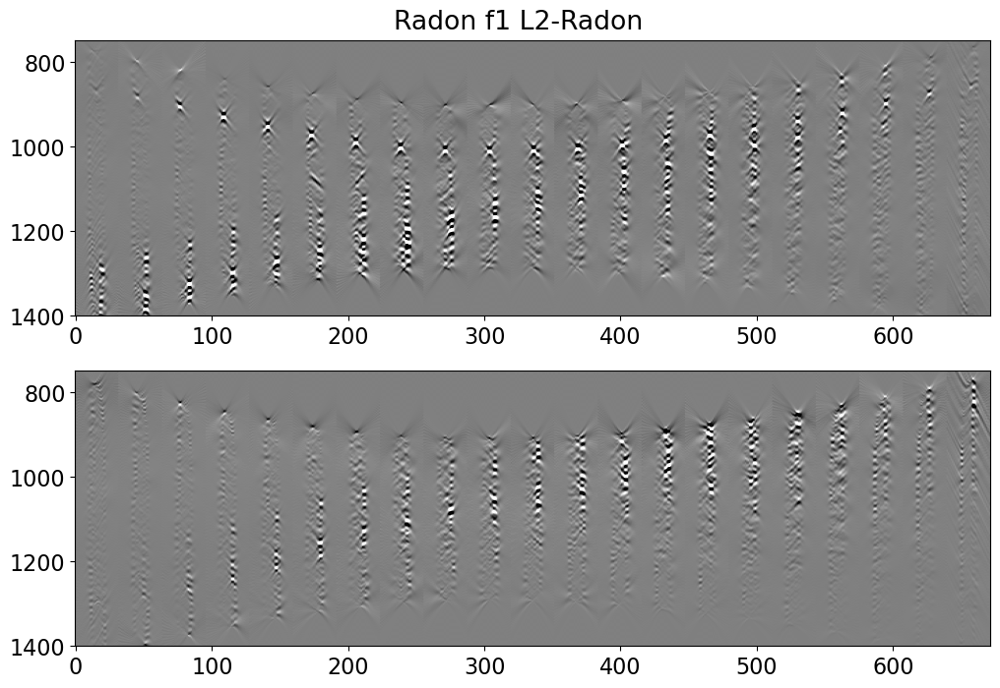

In [86]:
f1_inv_subl2radon_radon1 = f1_inv_subl2radon_radon[:npx*nwins*nt2].reshape(npx*nwins, nt2)
f1_inv_subl2radon_radon2 = f1_inv_subl2radon_radon[npx*nwins*nt2:].reshape(npx*nwins, nt2)

fig, axs = plt.subplots(2, 1, sharey=True, figsize=(12, 8))
fig.suptitle('Radon f1 L2-Radon', y=.92)
axs[0].imshow(f1_inv_subl2radon_radon1.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[0].axis('tight')
axs[1].imshow(f1_inv_subl2radon_radon2.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[1].axis('tight')
axs[1].set_ylim(1400, 750);

In [87]:
f1_inv_subl2radon_tot = f1_inv_subl2radon + np.concatenate((np.zeros((2*nt-1, ns)),
                                      fd_plus))
g_inv_subl2radon = Gop*f1_inv_subl2radon_tot.flatten()
g_inv_subl2radon = g_inv_subl2radon.reshape(2*(2*nt-1), nrava)

In [88]:
f1_inv_subl2radon_minus, f1_inv_subl2radon_plus =  f1_inv_subl2radon_tot[:(2*nt-1)].T, f1_inv_subl2radon_tot[(2*nt-1):].T
g_inv_subl2radon_minus, g_inv_subl2radon_plus =  -g_inv_subl2radon[:(2*nt-1)].T, np.fliplr(g_inv_subl2radon[(2*nt-1):].T)

g_inv_subl2radon_tot = g_inv_subl2radon_minus + g_inv_subl2radon_plus

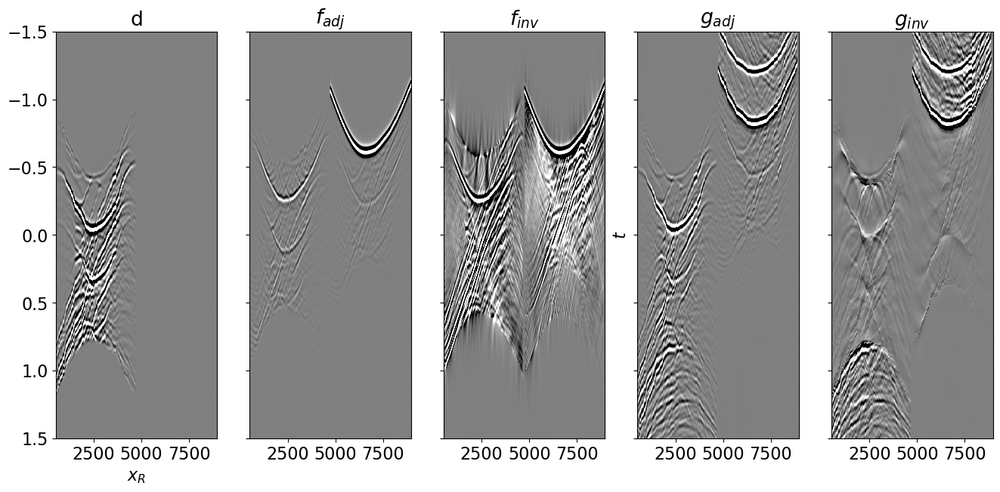

In [89]:
d_plot = np.concatenate((d[:(2*nt-1)], d[(2*nt-1):]), axis=1).T
f1_inv_subl2radon_plot = np.concatenate((f1_inv_subl2radon_tot[:(2*nt-1)], f1_inv_subl2radon_tot[(2*nt-1):]), axis=1).T
g_inv_subl2radon_plot = np.concatenate((g_inv_subl2radon[:(2*nt-1)], g_inv_subl2radon[(2*nt-1):]), axis=1).T

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(16, 7))
axs[0].imshow(d_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d'), axs[0].set_xlabel(r'$x_R$'), axs[3].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(f1_adj_subl2_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_adj_tot).max(), 
              vmax=0.1*np.abs(f1_adj_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$f_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(f1_inv_subl2radon_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_tot).max(), 
              vmax=0.1*np.abs(f1_inv_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$f_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(g_adj_subl2_plot.T, cmap='gray', vmin=-0.1*np.abs(g_adj).max(), 
              vmax=0.1*np.abs(g_adj).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[3].set_title(r'$g_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow(g_inv_subl2radon_plot.T, cmap='gray', vmin=-0.1*np.abs(g_inv).max(), 
              vmax=0.1*np.abs(g_inv).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[4].set_title(r'$g_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(1.5, -1.5);

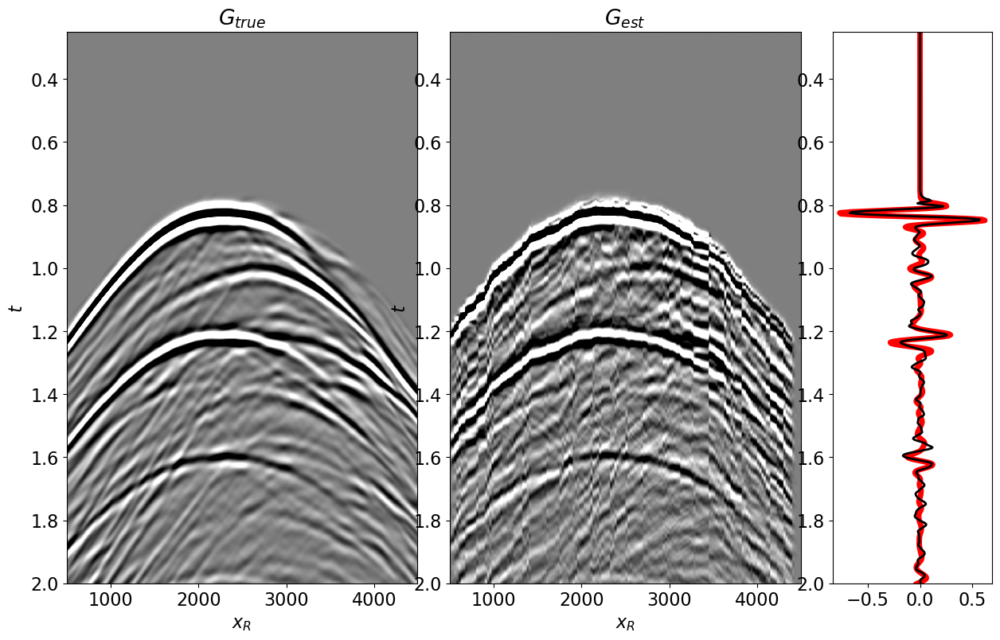

In [90]:
fig = plt.figure(figsize=(15,9))
ax1 = plt.subplot2grid((1, 5), (0, 0), colspan=2)
ax2 = plt.subplot2grid((1, 5), (0, 2), colspan=2)
ax3 = plt.subplot2grid((1, 5), (0, 4))

g_inv_subl2radon_tot_norm = (1-wr[iava, nt-1:]) * (g_inv_subl2radon_tot[:, nt-1:])/(g_inv_tot).max()

ax1.imshow(-g_true.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl2radon_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl2radon_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'$G_{true}$'), ax1.set_xlabel(r'$x_R$'), ax1.set_ylabel(r'$t$')
ax1.axis('tight')
ax1.set_ylim(2, 0.25)
ax2.imshow(-g_inv_subl2radon_tot_norm.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl2radon_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl2radon_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'$G_{est}$'), ax2.set_xlabel(r'$x_R$'), ax2.set_ylabel(r'$t$')
ax2.axis('tight')
ax2.set_ylim(2, 0.25)

ax3.plot((-g_true[iava[nrava//2],:])/(g_true).max(), t, 'r', lw=5)
ax3.plot((-g_inv_subl2radon_tot_norm[nrava//2, :])/(g_inv_subl2radon_tot_norm).max(), t, 'k', lw=2)
ax3.set_ylim(2, 0.25);

### L1 inversion with Radon sparsity

In [91]:
f1_inv_subl1radon_radon = fista(Mop_radon, d.ravel(), 
                            niter=200, eps=3e-1,
                           alpha = 2.399905e-03, 
                           show=True)[0]
f1_inv_subl1radon = Sparseop * f1_inv_subl1radon_radon
f1_inv_subl1radon = f1_inv_subl1radon.reshape(2*nt2, ns)

dpred_inv_subl1radon = Mop_radon @ f1_inv_subl1radon_radon
dpred_inv_subl1radon = dpred_inv_subl1radon.reshape(d.shape)

dpred_inv_subl1radon = Mop_radon @ f1_inv_subl1radon_radon
dpred_inv_subl1radon = dpred_inv_subl1radon.reshape(d.shape)

FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 703680 rows and 2955456 cols
eps = 3.000000e-01	tol = 1.000000e-10	niter = 200
alpha = 2.399905e-03	thresh = 3.599857e-04
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate


     1      -0.0000e+00         6.603e+05   6.610e+05   1.107e+01
     2       0.0000e+00         6.168e+05   6.181e+05   1.035e+01
     3       0.0000e+00         5.679e+05   5.699e+05   1.245e+01
     4       0.0000e+00         5.168e+05   5.196e+05   1.410e+01
     5       0.0000e+00         4.659e+05   4.696e+05   1.536e+01
     6       0.0000e+00         4.171e+05   4.216e+05   1.626e+01
     7       0.0000e+00         3.713e+05   3.767e+05   1.687e+01
     8       0.0000e+00         3.294e+05   3.357e+05   1.723e+01
     9       0.0000e+00         2.915e+05   2.986e+05   1.738e+01
    10       0.0000e+00         2.577e+05   2.657e+05   1.735e+01
    11       0.0000e+00         2.278e+05   2.366e+05   1.719e+01
    21       0.0000e+00         8.119e+04   9.630e+04   1.236e+01
    31      -0.0000e+00         4.673e+04   6.557e+04   8.264e+00
    41       0.0000e+00         3.311e+04   5.420e+04   6.351e+00
    51       0.0000e+00         2.567e+04   4.834e+04   5.294e+00
    61    

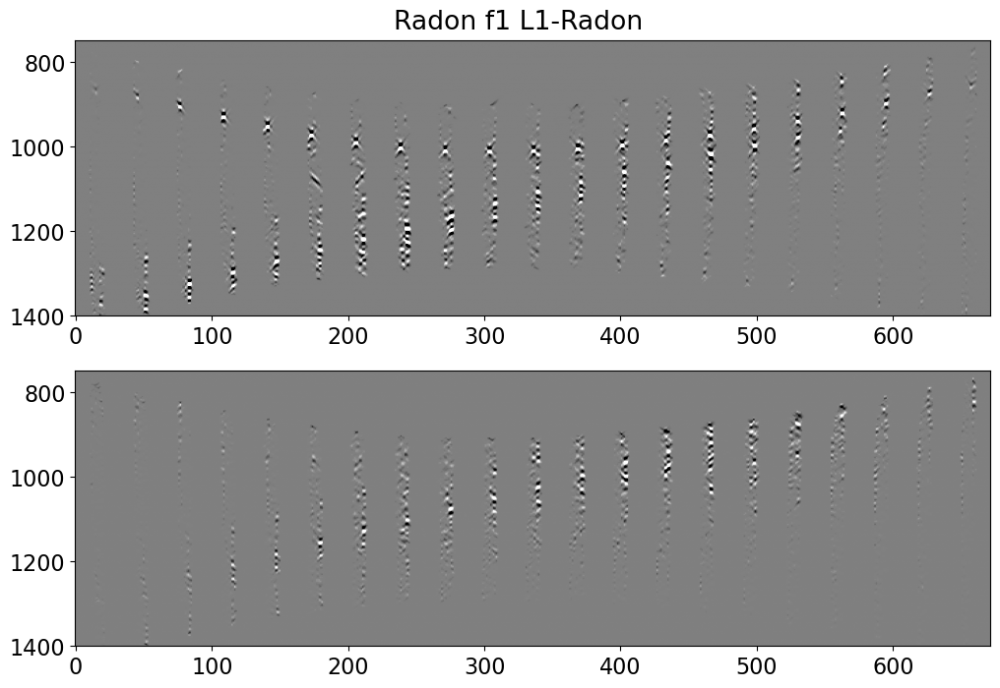

In [92]:
f1_inv_subl1radon_radon1 = f1_inv_subl1radon_radon[:npx*nwins*nt2].reshape(npx*nwins, nt2)
f1_inv_subl1radon_radon2 = f1_inv_subl1radon_radon[npx*nwins*nt2:].reshape(npx*nwins, nt2)

fig, axs = plt.subplots(2, 1, sharey=True, figsize=(12, 8))
fig.suptitle('Radon f1 L1-Radon', y=.92)
axs[0].imshow(f1_inv_subl1radon_radon1.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[0].axis('tight')
axs[1].imshow(f1_inv_subl1radon_radon2.T, cmap='gray', vmin=-5e0, vmax=5e0)
axs[1].axis('tight')
axs[1].set_ylim(1400, 750);

In [93]:
f1_inv_subl1radon_tot = f1_inv_subl1radon + np.concatenate((np.zeros((2*nt-1, ns)), fd_plus))

g_inv_subl1radon = Gop*f1_inv_subl1radon_tot.flatten()
g_inv_subl1radon = g_inv_subl1radon.reshape(2*(2*nt-1), nrava)

In [94]:
f1_inv_subl1radon_minus, f1_inv_subl1radon_plus =  f1_inv_subl1radon_tot[:(2*nt-1)].T, f1_inv_subl1radon_tot[(2*nt-1):].T
g_inv_subl1radon_minus, g_inv_subl1radon_plus = -g_inv_subl1radon[:(2*nt-1)].T, np.fliplr(g_inv_subl1radon[(2*nt-1):].T)

g_inv_subl1radon_tot = g_inv_subl1radon_minus + g_inv_subl1radon_plus

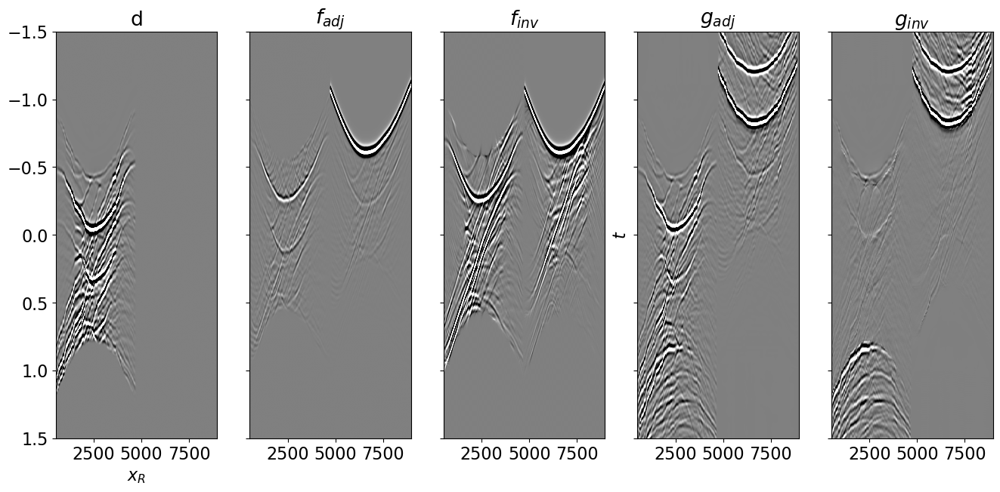

In [95]:
f1_inv_subl1radon_plot = np.concatenate((f1_inv_subl1radon_tot[:(2*nt-1)], f1_inv_subl1radon_tot[(2*nt-1):]), axis=1).T
g_inv_subl1radon_plot = np.concatenate((g_inv_subl1radon[:(2*nt-1)], g_inv_subl1radon[(2*nt-1):]), axis=1).T

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(16, 7))
axs[0].imshow(d_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d'), axs[0].set_xlabel(r'$x_R$'), axs[3].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(f1_adj_subl2_tot_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_adj_tot).max(), 
              vmax=0.1*np.abs(f1_adj_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$f_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(f1_inv_subl1radon_plot.T, cmap='gray', vmin=-0.1*np.abs(f1_inv_tot).max(), 
              vmax=0.1*np.abs(f1_inv_tot).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$f_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(g_adj_subl2_plot.T, cmap='gray', vmin=-0.1*np.abs(g_adj).max(), 
              vmax=0.1*np.abs(g_adj).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[3].set_title(r'$g_{adj}$'), axs[0].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow(g_inv_subl1radon_plot.T, cmap='gray', vmin=-0.1*np.abs(g_inv).max(), 
              vmax=0.1*np.abs(g_inv).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[4].set_title(r'$g_{inv}$'), axs[0].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(1.5, -1.5);

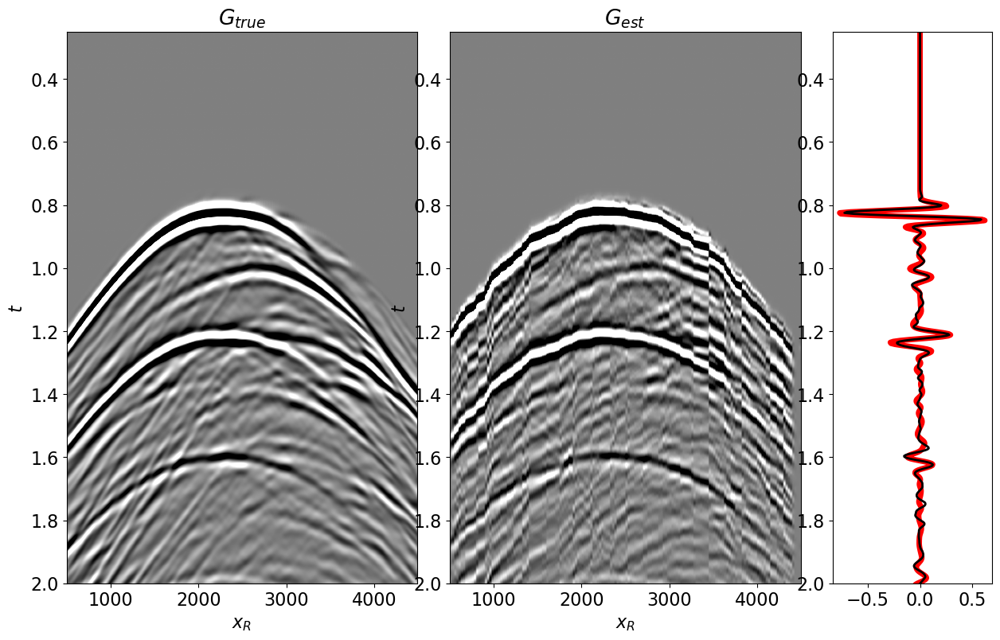

In [96]:
fig = plt.figure(figsize=(15,9))
ax1 = plt.subplot2grid((1, 5), (0, 0), colspan=2)
ax2 = plt.subplot2grid((1, 5), (0, 2), colspan=2)
ax3 = plt.subplot2grid((1, 5), (0, 4))

g_inv_subl1radon_tot_norm = (1-wr[iava, nt-1:]) * (g_inv_subl1radon_tot[:, nt-1:])/(g_inv_tot).max()

ax1.imshow(-g_true.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl1radon_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl1radon_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'$G_{true}$'), ax1.set_xlabel(r'$x_R$'), ax1.set_ylabel(r'$t$')
ax1.axis('tight')
ax1.set_ylim(2, 0.25)
ax2.imshow(-g_inv_subl1radon_tot_norm.T, cmap='gray', vmin=-0.1*np.abs(g_inv_subl1radon_tot_norm).max(), 
           vmax=0.1*np.abs(g_inv_subl1radon_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'$G_{est}$'), ax2.set_xlabel(r'$x_R$'), ax2.set_ylabel(r'$t$')
ax2.axis('tight')
ax2.set_ylim(2, 0.25)

ax3.plot((-g_true[iava[nrava//2],:])/(g_true).max(), t, 'r', lw=5)
ax3.plot((-g_inv_subl1radon_tot_norm[nrava//2, :])/(g_inv_subl1radon_tot_norm).max(), t, 'k', lw=2)
ax3.set_ylim(2, 0.25);

Finally compare data

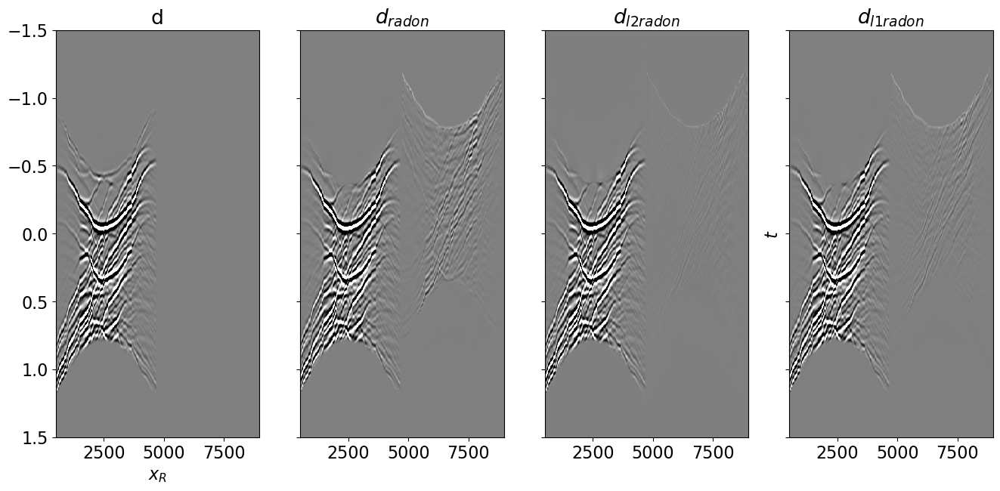

In [97]:
dpred_radon_plot = np.concatenate((dpred_radon[:(2*nt-1)], dpred_radon[(2*nt-1):]), axis=1).T
dpred_inv_subl2radon_plot = np.concatenate((dpred_inv_subl2radon[:(2*nt-1)], dpred_inv_subl2radon[(2*nt-1):]), axis=1).T
dpred_inv_subl1radon_plot = np.concatenate((dpred_inv_subl1radon[:(2*nt-1)], dpred_inv_subl1radon[(2*nt-1):]), axis=1).T

fig, axs = plt.subplots(1, 4, sharey=True, figsize=(16, 7))
axs[0].imshow(d_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[0].set_title('d'), axs[0].set_xlabel(r'$x_R$'), axs[3].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dpred_radon_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[1].set_title(r'$d_{radon}$'), axs[0].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(dpred_inv_subl2radon_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[2].set_title(r'$d_{l2radon}$'), axs[0].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(dpred_inv_subl1radon_plot.T, cmap='gray', vmin=-0.1*np.abs(d).max(), 
              vmax=0.1*np.abs(d).max(), extent=(r[0,0], 2*r[0,-1], t[-1], -t[-1]))
axs[3].set_title(r'$d_{l1radon}$'), axs[0].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[3].set_ylim(1.5, -1.5);

## Comparison

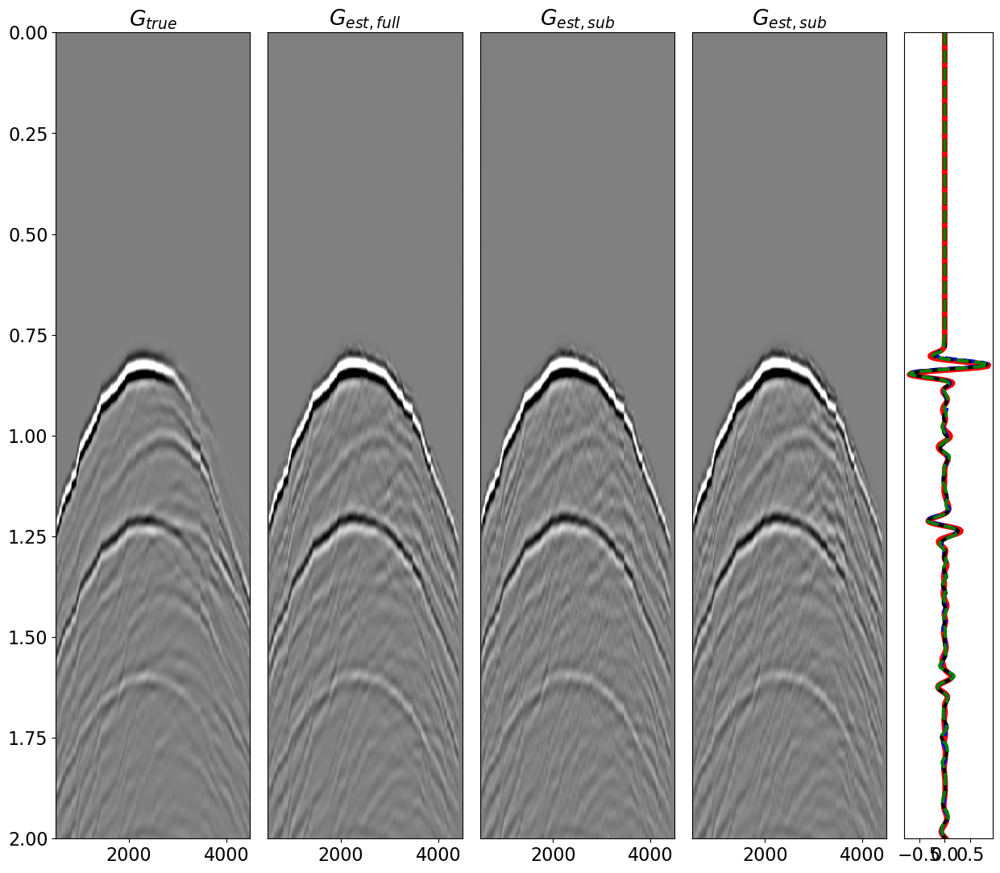

In [98]:
fig = plt.figure(figsize=(15,13))
ax1 = plt.subplot2grid((1, 9), (0, 0), colspan=2)
ax2 = plt.subplot2grid((1, 9), (0, 2), colspan=2)
ax3 = plt.subplot2grid((1, 9), (0, 4), colspan=2)
ax4 = plt.subplot2grid((1, 9), (0, 6), colspan=2)
ax5 = plt.subplot2grid((1, 9), (0, 8))

g_inv_tot_norm = (1-wr[iava][:, nt-1:]) * (g_inv_tot[iava][:, nt-1:])/(-g_inv_tot).max()
g_inv_subl2_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl2_tot[:, nt-1:])/(-g_inv_subl2_tot).max()
g_inv_subl1radon_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl1radon_tot[:, nt-1:])/(-g_inv_subl1radon_tot).max()
g_inv_subl2radon_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl2radon_tot[:, nt-1:])/(-g_inv_subl2radon_tot).max()

ax1.imshow(g_true[iava].T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'$G_{true}$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
ax1.axis('tight')
ax1.set_ylim(2, 0)
ax2.imshow(g_inv_tot_norm.T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'$G_{est,full}$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
ax2.axis('tight')
ax2.set_ylim(2, 0)
ax2.set_yticks([], [])
ax3.imshow(g_inv_subl2_norm.T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax3.set_title(r'$G_{est,sub}$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
ax3.axis('tight')
ax3.set_ylim(2, 0)
ax3.set_yticks([], [])
ax4.imshow(g_inv_subl1radon_norm.T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax4.set_title(r'$G_{est,sub}$'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
ax4.axis('tight')
ax4.set_ylim(2, 0)
ax4.set_yticks([], [])

g_true1 = g_true[iava][...,:nt]
g_inv_tot_norm1 = g_inv_tot_norm[...,:nt]
g_inv_subl2_norm1 = g_inv_subl2_norm[...,:nt]
g_inv_subl1radon_norm1 = g_inv_subl1radon_norm[...,:nt]

ax5.plot((g_true1[nrava//2,:]), t, 'r', lw=5)
ax5.plot((g_inv_tot_norm1[nrava//2, :]), t, '--b', lw=3)
ax5.plot((g_inv_subl2_norm1[nrava//2, :]), t, '--k', lw=3)
ax5.plot((g_inv_subl1radon_norm1[nrava//2, :]), t, '--g', lw=3)
ax5.set_ylim(2, 0)
ax5.set_yticks([], []);

In [99]:
g_inv_tot_norm = (1-wr[iava][:, nt-1:]) * (g_inv_tot[iava][:, nt-1:])/(-g_inv_tot).max()
g_inv_subl2_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl2_tot[:, nt-1:])/(-g_inv_subl2_tot).max()
g_inv_subl1radon_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl1radon_tot[:, nt-1:])/(-g_inv_subl1radon_tot).max()
g_inv_subl2radon_norm = (1-wr[iava][:, nt-1:]) * (g_inv_subl2radon_tot[:, nt-1:])/(-g_inv_subl2radon_tot).max()

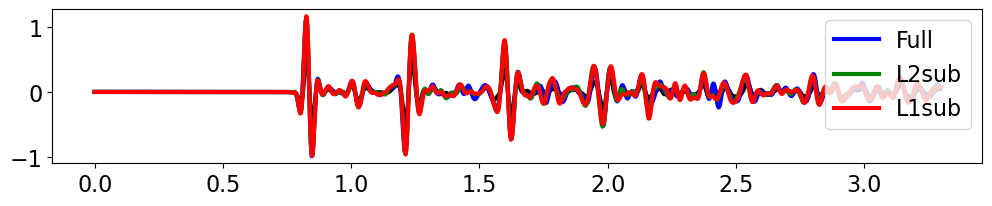

In [100]:
plt.figure(figsize=(12, 2))
plt.plot(t, t**2*g_true1[nrava//2,:], 'k', lw=3)
plt.plot(t, t**2*g_true1[nrava//2,:] + t**2*g_inv_tot_norm1[nrava//2, :], 
         'b', lw=3, label='Full')
plt.plot(t, t**2*g_true1[nrava//2,:] + t**2*g_inv_subl2_norm1[nrava//2, :], 
         'g', lw=3, label='L2sub')
plt.plot(t, t**2*g_true1[nrava//2,:] + t**2*g_inv_subl1radon_norm1[nrava//2, :], 
         'r', lw=3, label='L1sub')
plt.legend();

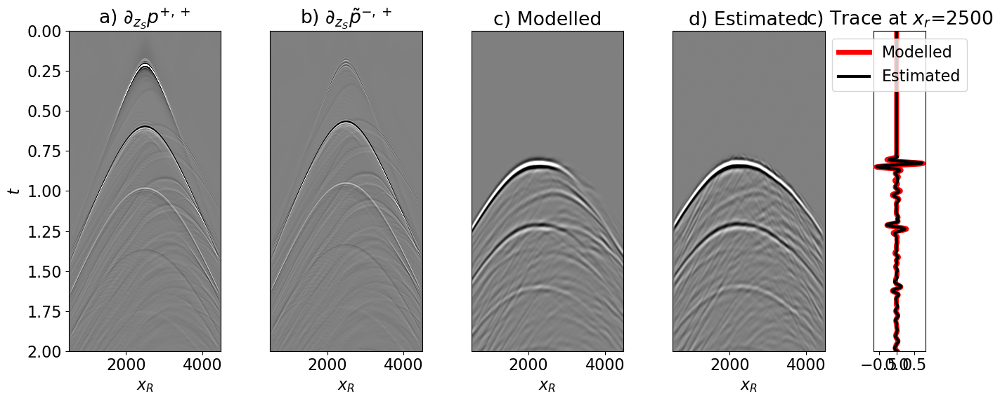

In [101]:
fig = plt.figure(figsize=(14, 6))
ax0a = plt.subplot2grid((1, 9), (0, 0), colspan=2)
ax0b = plt.subplot2grid((1, 9), (0, 2), colspan=2)
ax1 = plt.subplot2grid((1, 9), (0, 4), colspan=2)
ax2 = plt.subplot2grid((1, 9), (0, 6), colspan=2)
ax3 = plt.subplot2grid((1, 9), (0, 8))

g_inv_tot_norm = (1-wr[:, nt-1:]) * (g_inv_tot[:, nt-1:])/(-g_inv_tot).max()

ax0a.imshow(Pd[nr//2].T, cmap='gray', vmin=-0.1*np.abs(Pd).max(), 
           vmax=0.1*np.abs(Pd).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax0a.set_title(r'a) $\partial_{z_S} p^{+,+}$'), ax0a.set_xlabel(r'$x_R$'), ax0a.set_ylabel(r'$t$')
ax0a.axis('tight')
ax0a.set_ylim(2, 0)
ax0b.imshow(Pu[nr//2].T, cmap='gray', vmin=-0.1*np.abs(Pd).max(), 
           vmax=0.1*np.abs(Pd).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax0b.set_title(r'b) $\partial_{z_S} \tilde{p}^{-,+}$'), ax0b.set_xlabel(r'$x_R$')
ax0b.axis('tight')
ax0b.set_ylim(2, 0)
ax0b.set_yticks([], [])

ax1.imshow(g_true.T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax1.set_title(r'c) Modelled'), ax1.set_xlabel(r'$x_R$')
ax1.axis('tight')
ax1.set_ylim(2, 0)
ax1.set_yticks([], [])
ax2.imshow(g_inv_tot_norm.T, cmap='gray', vmin=-0.4*np.abs(g_inv_tot_norm).max(), 
           vmax=0.4*np.abs(g_inv_tot_norm).max(), extent=(r[0,0], r[0,-1], t[-1], t[0]))
ax2.set_title(r'd) Estimated'), ax2.set_xlabel(r'$x_R$')
ax2.axis('tight')
ax2.set_yticks([], [])
ax2.set_ylim(2, 0)

g_true1 = g_true[...,:nt]
g_inv_tot_norm1 = g_inv_tot_norm[...,:nt]

ax3.plot((g_true1[ns//2,:])/(g_true1).max(), t, 'r', lw=5, label='Modelled')
ax3.plot((g_inv_tot_norm1[ns//2, :])/(g_inv_tot_norm1).max(), t, 'k', lw=3, label='Estimated')
ax3.set_yticks([], [])
ax3.set_ylim(2, 0)
ax3.set_title(fr'c) Trace at $x_r$={r[0, ns//2]:.0f}'), ax2.set_xlabel(r'$x_R$');
ax3.legend(loc='upper center')
plt.tight_layout()

# plt.savefig(f'Figs/grec.eps',  bbox_inches='tight' )

[]

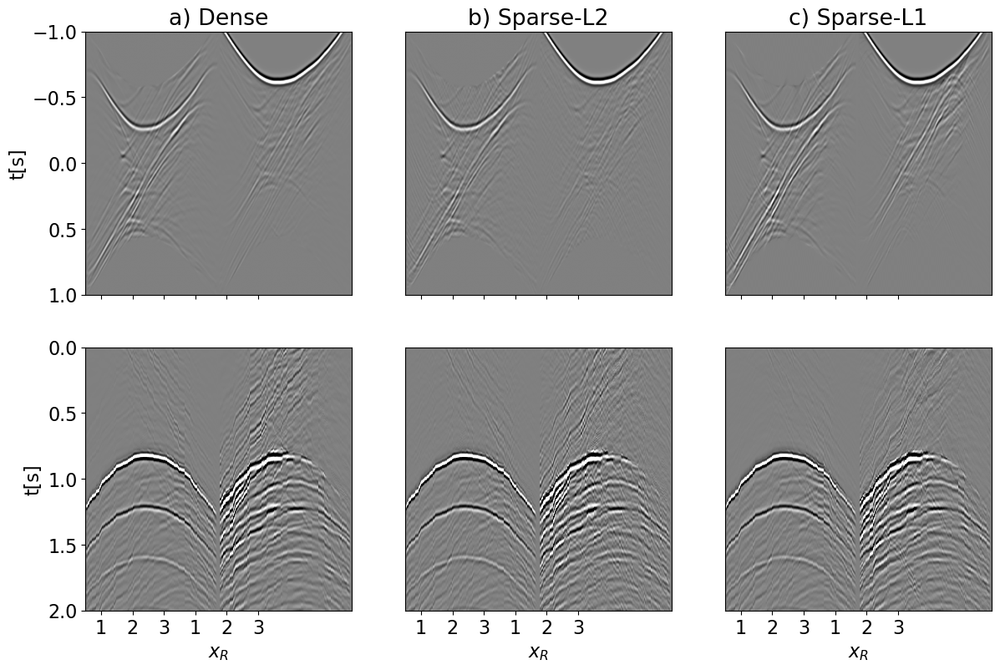

In [102]:
g_inv_plot = np.concatenate((np.flipud(g_inv[(2*nt-1):, iava]), 4*g_inv[:(2*nt-1), iava]), axis=1).T
g_inv_subl2_plot = np.concatenate((np.flipud(g_inv_subl2[(2*nt-1):]), 4*g_inv_subl2[:(2*nt-1)]), axis=1).T
g_inv_subl1radon_plot = np.concatenate((np.flipud(g_inv_subl1radon[(2*nt-1):]), 4*g_inv_subl1radon[:(2*nt-1)]), axis=1).T
g_inv_subl2radon_plot = np.concatenate((np.flipud(g_inv_subl2radon[(2*nt-1):]), 4*g_inv_subl2radon[:(2*nt-1)]), axis=1).T

fig, axs = plt.subplots(2, 3, sharex=True, figsize=(14, 9))

axs[0][0].imshow(f1_inv_tot_plot.T, cmap='gray', vmin=-5e1, vmax=5e1, 
              extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[0][0].set_title(r'a) Dense'), axs[0][0].set_ylabel(r't[s]')
axs[0][0].axis('tight')
axs[0][0].set_ylim(1., -1.)
axs[0][0].set_xticks([0, 1, 2, 3, 4, 5, 6], [0, 1, 2, 3, 1, 2, 3])
axs[0][1].imshow(f1_inv_subl2_tot_plot.T, cmap='gray', vmin=-5e1, vmax=5e1, 
              extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[0][1].set_title(r'b) Sparse-L2')
axs[0][1].axis('tight')
axs[0][1].set_ylim(1., -1.)
axs[0][1].set_yticks([], [])
axs[0][2].imshow(f1_inv_subl1radon_plot.T, cmap='gray', vmin=-5e1, vmax=5e1, 
              extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[0][2].set_title(r'c) Sparse-L1')
axs[0][2].axis('tight')
axs[0][2].set_ylim(1., -1.)
axs[0][2].set_yticks([], [])

axs[1][0].imshow(g_inv_plot.T, cmap='gray', vmin=-2e1, vmax=2e1, 
              extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[1][0].set_xlabel(r'$x_R$'), axs[1][0].set_ylabel(r't[s]')
axs[1][0].axis('tight')
axs[1][0].set_ylim(2., 0)
axs[1][1].imshow(g_inv_subl2_plot.T, cmap='gray', vmin=-2e1, vmax=2e1, 
              extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[1][1].set_xlabel(r'$x_R$')
axs[1][1].axis('tight')
axs[1][1].set_ylim(2., 0)
axs[1][1].set_yticks([], [])
axs[1][2].imshow(g_inv_subl1radon_plot.T, cmap='gray', vmin=-2e1, vmax=2e1, 
                 extent=(r[0,0]/1e3, 2*r[0,-1]/1e3, t[-1], -t[-1]))
axs[1][2].set_xlabel(r'$x_R$')
axs[1][2].axis('tight')
axs[1][2].set_ylim(2., 0)
axs[1][2].set_yticks([], [])
#plt.tight_layout()

# plt.savefig(f'Figs/f_g_sparserec_{perc_subsampling}.eps',  bbox_inches='tight' )